# Underwater analysis of feature detectors

Some methods needed for analysis:

In [4]:
def read_segmentation_results(paths, stop = False, stop_limit = 0):
    all_feature_counts = []
    all_percentages = []
    all_time_counts = []

    for i in range(number_of_tests):
        feature_counts = []
        percentages = []
        time_counts = []
    
        with open(paths[i], mode ='r')as file:
            csvFile = csv.reader(file)
            line_number = 0
            for lines in csvFile:
                # Skip first line
                if line_number != 0:
                    feature_counts.append(float(lines[2]))
                    percentages.append(float(lines[4]))
                    time_counts.append(float(lines[5]))
                line_number = line_number+1
                if(stop == True and line_number >= stop_limit):
                    break
        all_feature_counts.append(feature_counts)
        all_percentages.append(percentages)
        all_time_counts.append(time_counts)
    return all_feature_counts, all_percentages, all_time_counts

def split_data_in_csv(path,splitter_index, skip):
    with open(path,mode='r') as file:
        
        for lines in csvFile:
            if(line_number != 0 and skip == True or skip == False):
                print("ff")
                

def read_annotation_results(paths):
    all_feature_counts = []
    all_percentages = []
    all_time_counts = []

    for i in range(len(paths)):
        with open(paths[i],mode = 'r') as file:
            csvFile = csv.reader(file)
            line_number = 0
            last_setting = "-10"
            current_features = []
            current_percentages = []
            current_time = []
            append_index = 0

            for lines in csvFile:
                if line_number != 0:
                    # get setting value
                    setting = str(lines[6])

                    if(setting != last_setting and last_setting != "-10" and i == 0):
                        all_feature_counts.append(current_features)
                        all_percentages.append(current_percentages)
                        all_time_counts.append(current_time)
                        current_features = []
                        current_percentages = []
                        current_time = []
                        current_features.append(float(lines[2]))
                        current_percentages.append(float(lines[4]))
                        current_time.append(float(lines[5]))
                    elif(setting != last_setting and last_setting != "-10"):
                        append_index = append_index+1
                        all_feature_counts[append_index].append(float(lines[2]))
                        all_percentages[append_index].append(float(lines[4]))
                        all_time_counts[append_index].append(float(lines[5]))
                        
                    elif(i == 0):
                        current_features.append(float(lines[2]))
                        current_percentages.append(float(lines[4]))
                        current_time.append(float(lines[5]))
                    else:
                        all_feature_counts[append_index].append(float(lines[2]))
                        all_percentages[append_index].append(float(lines[4]))
                        all_time_counts[append_index].append(float(lines[5]))
                    last_setting = setting
                line_number = line_number+1
            if(i == 0):
                all_feature_counts.append(current_features)
                all_percentages.append(current_percentages)
                all_time_counts.append(current_time)
    return all_feature_counts, all_percentages, all_time_counts

def read_matching_results(paths):
    all_match_counts = []
    all_percentages = []
    all_time_counts = []

    for i in range(len(paths)):
        with open(paths[i],mode = 'r') as file:
            csvFile = csv.reader(file)
            line_number = 0
            last_setting = "-10"
            current_matches = []
            current_percentages = []
            current_time = []
            append_index = 0

            for lines in csvFile:
                if line_number > 1: # ignore labels and first line since matching needs two frames
                    # get setting value
                    setting = str(lines[5])

                    if(setting != last_setting and last_setting != "-10" and i == 0):
                        all_match_counts.append(current_matches)
                        all_percentages.append(current_percentages)
                        all_time_counts.append(current_time)
                        current_matches = []
                        current_percentages = []
                        current_time = []
                        # Dont add first line
                        #current_matches.append(float(lines[2]))
                        #current_percentages.append(float(lines[3]))
                        #current_time.append(float(lines[4]))
                    elif(setting != last_setting and last_setting != "-10"):
                        append_index = append_index+1
                        all_match_counts[append_index].append(float(lines[2]))
                        all_percentages[append_index].append(float(lines[3]))
                        all_time_counts[append_index].append(float(lines[4]))
                        
                    elif(i == 0):
                        current_matches.append(float(lines[2]))
                        current_percentages.append(float(lines[3]))
                        current_time.append(float(lines[4]))
                    else:
                        all_match_counts[append_index].append(float(lines[2]))
                        all_percentages[append_index].append(float(lines[3]))
                        all_time_counts[append_index].append(float(lines[4]))
                    last_setting = setting
                line_number = line_number+1
            if(i == 0):
                all_match_counts.append(current_matches)
                all_percentages.append(current_percentages)
                all_time_counts.append(current_time)
    return all_match_counts, all_percentages, all_time_counts


def clean_data(data):
    cleaned_data = []
    for i in range(len(data)):
        if data[i] >= 0:
            cleaned_data.append(data[i])
    return cleaned_data

def clean_data_zero(data):
    cleaned_data = []
    for i in range(len(data)):
        if data[i] >= 0:
            cleaned_data.append(data[i])
        else:
            cleaned_data.append(0)
    return cleaned_data


def read_match_results(paths):
    all_match_counts = []
    all_match_percentages = []
    for i in range(number_of_tests):
        match_counts = []
        match_percentages = []
        with open(paths[i], mode ='r')as file:
            csvFile = csv.reader(file)
            line_number = 0
            for lines in csvFile:
                # Skip first line
                if line_number != 0:
                    match_counts.append(float(lines[2]))
                    # Only read positive percentages
                    if float(lines[3]) >= 0:
                        match_percentages.append(float(lines[3]))
                line_number = line_number+1
        all_match_counts.append(match_counts)
        all_match_percentages.append(match_percentages)
    return all_match_counts, all_match_percentages

def find_median_and_quartiles(environment_data, start = 0):
    medians = []
    percentiles_25 = []
    percentiles_75 = []
    
    for i in range(len(environment_data)):
        temp_medians = []
        temp_percentiles_25 = []
        temp_percentiles_75 = []

        for j in range(start,len(environment_data[0])):
            if(len(environment_data[i][j]) == 0):
                temp_medians.append(0)
                temp_percentiles_25.append(0)
                temp_percentiles_75.append(0)
            else:    
                temp_medians.append(statistics.median(environment_data[i][j]))
                temp_percentiles_25.append(np.percentile(environment_data[i][j], 25))
                temp_percentiles_75.append(np.percentile(environment_data[i][j], 75))
        medians.append(temp_medians)
        percentiles_25.append(temp_percentiles_25)
        percentiles_75.append(temp_percentiles_75)
        
    return medians, percentiles_25, percentiles_75

def remove_invalid(data):
    valid_counts = []
    cleaned_data = []
    
    for i in range(len(data)):
        clean_temp = clean_data(data[i])
        cleaned_data.append(clean_temp)
        valid_counts.append(len(cleaned_data[i]))
    return cleaned_data, valid_counts

def pad_invalid(data):
    cleaned_data = []
    
    for i in range(len(data)):
        clean_temp = clean_data_zero(data[i])
        cleaned_data.append(clean_temp)
    return cleaned_data

Methods for making plots

In [7]:
def line_graph_median_and_quantiles(x_values,medians,percentiles_25,percentiles_75,labels, use_log, x_label, y_label, title, save, colors,save_title=""):

    if(use_log == True):
        plt.xscale("log")

    for i in range(len(medians)):
        plt.plot(x_values,medians[i],marker='.',color=colors[i],label=labels[i])
        plt.fill_between(x_values, percentiles_25[i],percentiles_75[i], alpha=0.2)

    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    plt.legend()
    if(save == True):
        plt.savefig(save_title)#,bbox_inches='tight')
    plt.show()

def show_validity_table(tables,validities,all_data,headers,settings,shrink = True):
    # Prepare table data
    table_data = [[],[],[]]

    old_percentage = 0.0
    last_row = []
    last_added = False
    for i in range(len(tables)):
        row = []
        for j in range(len(settings)):
            percentage = (validities[i][j]/len(all_data[i][j]))*100.0
            row = [settings[j],validities[i][j],len(all_data[i][j]),percentage]
            if(shrink == False):
                table_data[i].append(row)
            else:
                if(j == 0 or j == len(settings)-1):
                    table_data[i].append(row)
                    last_added = True
                elif(old_percentage != percentage):
                    if(last_added == False):
                        table_data[i].append(last_row)
                    table_data[i].append(row)
                    last_added = True
                else:
                    last_added = False
                old_percentage = percentage
                last_row = row
                

    #display table
    for i in range(len(tables)):
        print(tables[i]+":")
        print(tabulate(table_data[i], headers=headers,tablefmt="heavy_grid", numalign="right", floatfmt=".7f"))

def print_best(settings, data, title):
    final_sum = 0
    final_value = 0
    for j in range(len(settings)):
        data_sum = 0
        for i in range(len(data)):
            data_sum = data_sum + data[i][j]
        print(data_sum)
        if data_sum > final_sum:
            final_sum = data_sum
            final_value = settings[j]
    print("The best median performance is at "+title+": " + str(final_value) + " with a percentage sum of " + str(final_sum))

def show_double_grouped_boxplots(upper_group,settings, input_data, colors, setting_name, y_label,title,save = False,save_title=""):
    groups = []
    for i in range(len(upper_group)):
        #temp_dataframe = pd.DataFrame()
        dictionary = {}
        for j in range(len(settings)):
            dictionary.update({settings[j]:input_data[i][j]})
        print(len(dictionary))
        temp_dataframe = pd.DataFrame(dict([(k,pd.Series(v)) for k,v in dictionary.items() ]))
        #for j in range(len(settings)):
            #dictionary = dict(settings[j] = input_data[i][j])
            #temp_dataframe
            #temp_dataframe.append({settings[j]:input_data[i][j]},ignore_index=True)
            #temp_dataframe[settings[j]] = input_data[i][j]
            #temp_dataframe.loc[len(temp_dataframe)] =
        groups.append(temp_dataframe)
    print(len(groups))
    x_range = np.arange(len(groups)) / (len(groups)-1)
    x_position = (x_range*0.5)+0.75

    plt.grid(zorder=0)
    for i,data in enumerate(groups):
        temp_data = np.array(data)
        temp_data = [np.nan_to_num(group,nan=np.nanmean(group)) for group in temp_data]
        current_plot = plt.boxplot(np.array(temp_data),sym='',whis=[0,100],widths=0.6/len(groups),tick_labels=list(groups[0]),zorder=3,patch_artist=True,positions=[x_position[i]+j*1 for j in range(len(data.T))])

        k = i % len(colors)
        for box in current_plot['boxes']:
            box.set(facecolor=colors[k])
        for element in ['fliers','means','medians']:
            plt.setp(current_plot[element],color='black')
        for element in ['whiskers','caps']:
            plt.setp(current_plot[element],color = 'black')
            plt.setp(current_plot[element],color = 'black')

    legend_titles = []
    for i in range(len(groups)):
        j = i % len(upper_group)
        k = i % len(colors)
        legend_titles.append(Patch(facecolor=colors[k], label=upper_group[j]))
        
    plt.legend(handles=legend_titles, fontsize=8)
    plt.xlabel(setting_name)
    plt.xticks(np.arange(len(list(groups[0])))+1)
    plt.ylabel(y_label)
    plt.title(title)
    plt.xlim([0.5, len(list(groups[0])) + 0.5])
    if(save == True):
        plt.savefig(save_title)#,bbox_inches='tight')
    plt.show()

def show_median_bargraph(settings,groups,colors, percentiles_75, medians, percentiles_25,x_label,y_label,title,save,save_title=""):
    # Create placement
    barwidth = 0.25
    placements = []
    last_placements = []
    for i in range(len(groups)):
        temp_placement = []
        if(i == 0):
            temp_placement = np.arange(len(settings))
        else:
            temp_placement = [x+barwidth for x in last_placements]
        last_placements = temp_placement
        placements.append(temp_placement)

    # Plot
    plt.grid(zorder=0)
    for i in range(len(groups)):
        plt.bar(placements[i],percentiles_75[i],width=barwidth,color=colors[i],alpha=0.25,zorder=3)
        plt.bar(placements[i],medians[i],width=barwidth,color=colors[i],alpha=0.5,zorder=3)
        plt.bar(placements[i],percentiles_25[i],width=barwidth,color=colors[i], label=groups[i],zorder=3)

    plt.xlabel(x_label)
    plt.xticks([r+barwidth for r in range(len(settings))],settings)
    plt.ylabel(y_label)
    plt.title(title)
    plt.legend()
    if(save == True):
        plt.savefig(save_title)#,bbox_inches='tight')
    plt.show()

## AKAZE test:

### Threshold

For the threshold test all other parameters where kept constant at:<br>
Descriptor type: MLDB<br>
Descriptor size : 0 (Full size)<br>
Descriptor channels: 3<br>
Max octaves: 4<br>
Octave sublevels: 4<br>
Diffusivity type: PM G2<br>

In [93]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
max_environment_tests = 2
thresholds = [0.0000001,0.000001,0.00001,0.0001,0.001,0.01,0.1]

# Get all file paths
for i in range(max_environment_tests):
    if(i < 3):
        path_clear = '../Data/Akaze/annotation/threshold_annotation_clear'+str(i+1)+'.csv'
        path_tank = '../Data/Akaze/annotation/threshold_annotation_tank'+str(i+1)+'.csv'
        paths_clear.append(path_clear)
        paths_tank.append(path_tank)
    if(i < 2):
        path_crowded = '../Data/Akaze/annotation/threshold_annotation_crowded'+str(i+1)+'.csv'
        paths_crowded.append(path_crowded)
    
# Extract desired information
all_feature_counts_clear, all_percentages_clear, all_time_counts_clear = read_annotation_results(paths_clear)
all_feature_counts_tank, all_percentages_tank, all_time_counts_tank = read_annotation_results(paths_tank)
all_feature_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_annotation_results(paths_crowded)

Check number of samples usable

In [96]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
environments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["Threshold","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers, thresholds)

Clear:
┏━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Threshold ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃   0.0000001 ┃             100 ┃             100 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃   0.0001000 ┃             100 ┃             100 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃   0.0010000 ┃              65 ┃             100 ┃         65.0000000 ┃
┣━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃   0.0100000 ┃               5 ┃             100 ┃          5.0000000 ┃
┣━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃   0.1000000 ┃               0 ┃             100 ┃          0.0000000 ┃
┗━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━━━━┛
Crowded:
┏━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━

These results indicate that thresholds of 0.1 are way to high as expected and that atleast 0.0001 should be used for underwater environments allways producing features. 0.001 can to some extent also be used, especially if tank and crowded environments are the only use-case. Now feature counts, percentage of features within areas of interest and time to detect are analyzed for each threshold, including 25 and 75% percentiles.

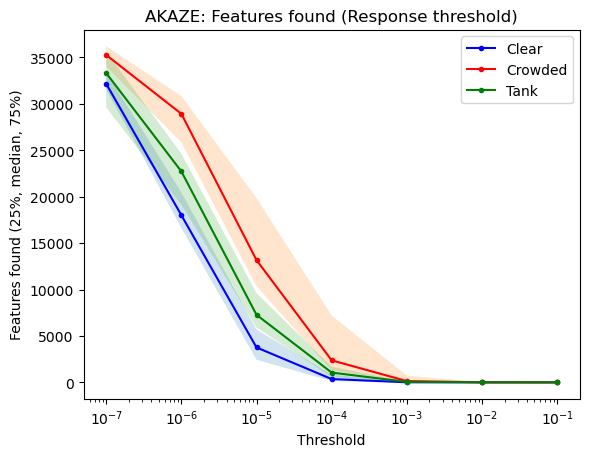

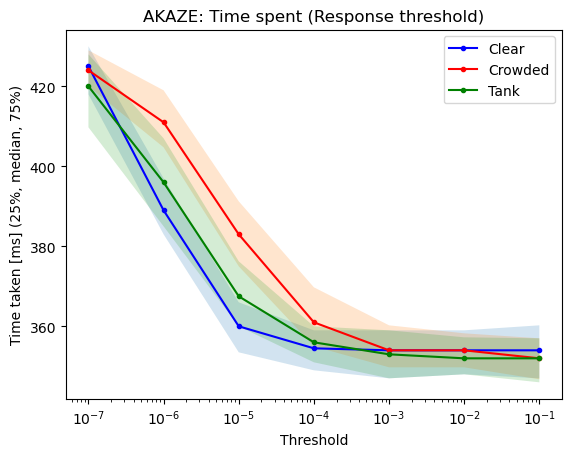

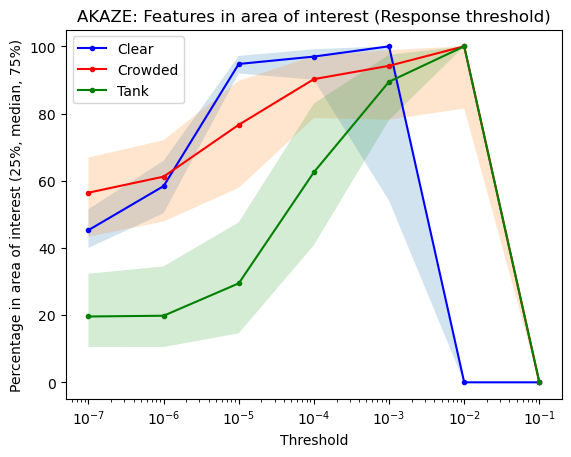

121.32655
139.42935
200.85694999999998
249.71810000000002
283.6766
200.0
0
The best median performance is at threshold: 0.001 with a percentage sum of 283.6766


In [99]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
feature_environments = [all_feature_counts_clear,all_feature_counts_crowded,all_feature_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]

feature_medians, feature_25, feature_75 = find_median_and_quartiles(feature_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of features is plotted
line_graph_median_and_quantiles(thresholds,feature_medians,feature_25,feature_75,environments, True, 'Threshold', 'Features found (25%, median, 75%)', "AKAZE: Features found (Response threshold)", True,colors,"../Data/Graphs/AKAZE/AKAZE_features_response_threshold.png")
# Time taken is plotted
line_graph_median_and_quantiles(thresholds,time_medians,time_25,time_75,environments, True, 'Threshold', 'Time taken [ms] (25%, median, 75%)', "AKAZE: Time spent (Response threshold)", True,colors,"../Data/Graphs/AKAZE/AKAZE_time_response_threshold.png")
# Percentage is plotted
line_graph_median_and_quantiles(thresholds,percentage_medians,percentage_25,percentage_75,environments, True, 'Threshold', 'Percentage in area of interest (25%, median, 75%)', "AKAZE: Features in area of interest (Response threshold)", True,colors,"../Data/Graphs/AKAZE/AKAZE_percentage_response_threshold.png")

# Find layer with best median value
print_best(thresholds,percentage_medians,"threshold")

We see a quite stable decrease in the amount of features for all environments with the increase in threshold. It is however also seen that the amount of features in areas of interest are the ones that survive when the threshold is increased until a point of breakage that is different dependent on environment. 0.01 for tank and crowded and 0.001 for clear. The best results in terms of ratio of features in areas of interest is best around 0.001, which is just before the clear environments crash. This would however result in very limited feature count at a median of 5 for clear environments. Decreasing it to 0.0001 might therefore be beneficial to ensure more data to work with.

### Diffusivity:

For the diffusivity tests all other parameters where kept constant at:<br>
Descriptor type: MLDB<br>
Descriptor size : 0 (Full size)<br>
Descriptor channels: 3<br>
Threshold: 0.0001<br>
Max octaves: 4<br>
Octave sublevels: 4<br>

In [526]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
max_environment_tests = 4
diffusivity_settings = ["PM G1", "PM G2", "Weickert","Charbonnier"]

# Get all file paths
for i in range(max_environment_tests):
    if(i < 3):
        path_clear = '../Data/Akaze/annotation/diffusivity_annotation_clear'+str(i+1)+'.csv'
        path_tank = '../Data/Akaze/annotation/diffusivity_annotation_tank'+str(i+1)+'.csv'
        paths_clear.append(path_clear)
        paths_tank.append(path_tank)
    if(i < 2):
        path_crowded = '../Data/Akaze/annotation/diffusivity_annotation_crowded'+str(i+1)+'.csv'
        paths_crowded.append(path_crowded)
    #path_crowded = '../Data/Akaze/annotation/diffusivity_annotation_crowded'+str(i+1)+'.csv'
    #paths_crowded.append(path_crowded)
    
# Extract desired information
all_feature_counts_clear, all_percentages_clear, all_time_counts_clear = read_annotation_results(paths_clear)
all_feature_counts_tank, all_percentages_tank, all_time_counts_tank = read_annotation_results(paths_tank)
all_feature_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_annotation_results(paths_crowded)

Check number of samples usable:

In [529]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["Diffusivity type","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers, diffusivity_settings,False)

Clear:
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃ Diffusivity type   ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ PM G1              ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ PM G2              ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ Weickert           ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ Charbonnier        ┃             150 ┃             150 ┃        100.0000000 ┃
┗━━━━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━━━━┛
Crowded:
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃ Diffusivity type   ┃  

No affect is seen on validity. Now testing for feature count, area of interest ratio and time.

4
4
4
3


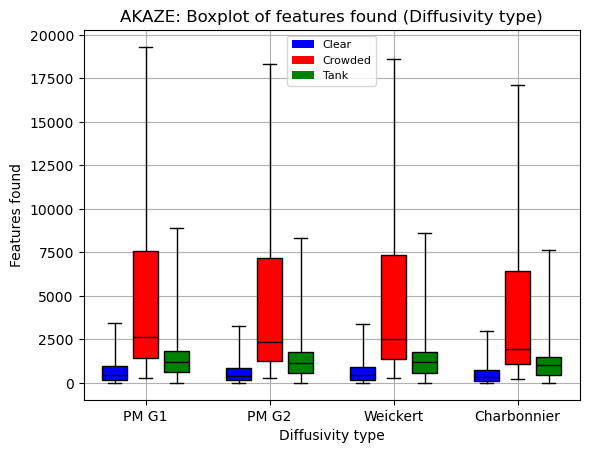

4
4
4
3


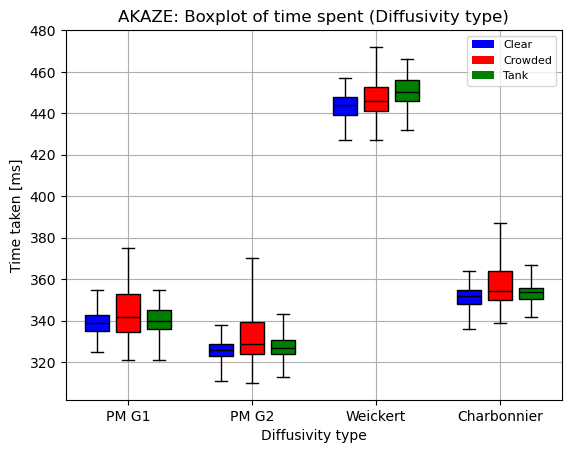

4
4
4
3


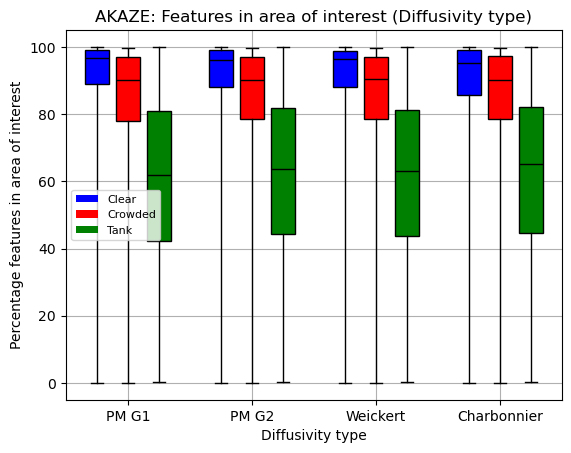

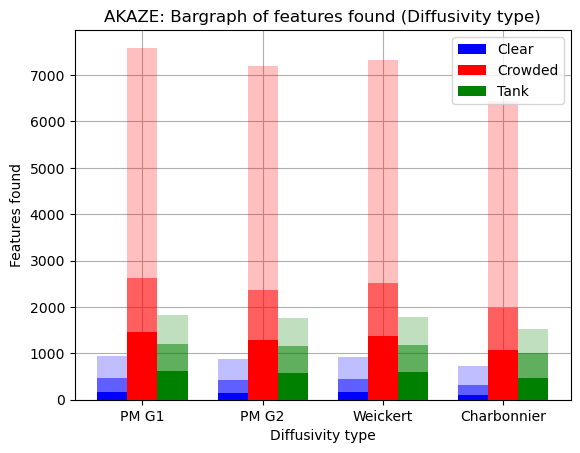

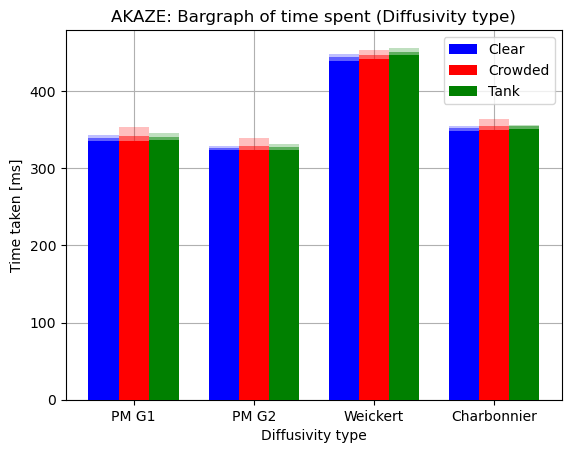

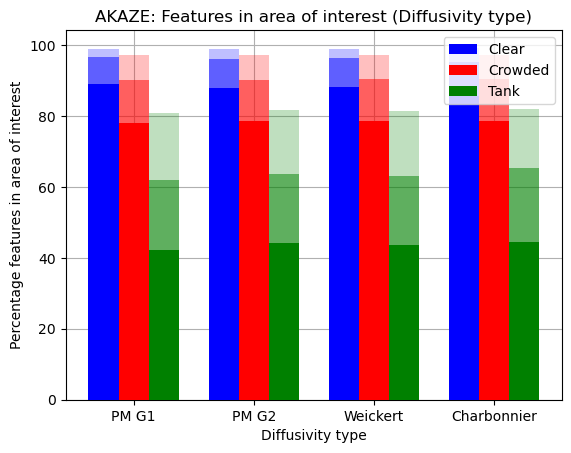

248.63045
249.98905
249.70675
250.5986
The best median performance is at diffusivity type: Charbonnier with a percentage sum of 250.5986


In [532]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import numpy as np
import statistics
import seaborn as sns
import pandas as pd

# Find medians and quantiles
feature_environments = [all_feature_counts_clear,all_feature_counts_crowded,all_feature_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]

feature_medians, feature_25, feature_75 = find_median_and_quartiles(feature_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Show boxplots
colors = ['b','r','g']
show_double_grouped_boxplots(enviroments,diffusivity_settings, feature_environments, colors, 'Diffusivity type', 'Features found','AKAZE: Boxplot of features found (Diffusivity type)',True,"../Data/Graphs/AKAZE/AKAZE_box_features_diffusivity_type.png")
show_double_grouped_boxplots(enviroments,diffusivity_settings, time_environments, colors, 'Diffusivity type', 'Time taken [ms]','AKAZE: Boxplot of time spent (Diffusivity type)',True,"../Data/Graphs/AKAZE/AKAZE_box_time_diffusivity_type.png")
show_double_grouped_boxplots(enviroments,diffusivity_settings, percentage_environments, colors, 'Diffusivity type', 'Percentage features in area of interest','AKAZE: Features in area of interest (Diffusivity type)',True,"../Data/Graphs/AKAZE/AKAZE_box_percentage_diffusivity_type.png")

# Show barplots
show_median_bargraph(diffusivity_settings,environments,colors, feature_75, feature_medians, feature_25, 'Diffusivity type', 'Features found', 'AKAZE: Bargraph of features found (Diffusivity type)',True,"../Data/Graphs/AKAZE/AKAZE_bar_features_diffusivity_type.png")
show_median_bargraph(diffusivity_settings,environments,colors, time_75, time_medians, time_25, 'Diffusivity type', 'Time taken [ms]', 'AKAZE: Bargraph of time spent (Diffusivity type)',True,"../Data/Graphs/AKAZE/AKAZE_bar_time_diffusivity_type.png")
show_median_bargraph(diffusivity_settings,environments,colors, percentage_75, percentage_medians, percentage_25, 'Diffusivity type', 'Percentage features in area of interest', 'AKAZE: Features in area of interest (Diffusivity type)',True,"../Data/Graphs/AKAZE/AKAZE_bar_percentage_diffusivity_type.png")

# Find layer with best median value
print_best(diffusivity_settings,percentage_medians,"diffusivity type")

It can be seen that the different diffusivity types have similar performance. PM G1 seems to be slightly better in terms of feature count with Charbonnier lacking behind. PM G2 is seen to have the best time performance with Weickert being the slowest. In terms of features in area of interest, all seem to perform very similar with a total of 1.968 percent points difference between the best Charboonier and the worst PM G1. PM G2 is chosen due to its speed.

### Maximum octaves

For the diffusivity tests all other parameters where kept constant at:<br>
Descriptor type: MLDB<br>
Descriptor size : 0 (Full size)<br>
Descriptor channels: 3<br>
Threshold: 0.0001<br>
Octave sublevels: 4<br>
Diffusivity type: PM G2<br>

In [114]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
max_environment_tests = 4
max_octaves = [1,2,3,4,5,6,7,8,9,10]

# Get all file paths
for i in range(max_environment_tests):
    if(i < 3):
        path_clear = '../Data/Akaze/annotation/number_octaves_annotation_clear'+str(i+1)+'.csv'
        path_tank = '../Data/Akaze/annotation/number_octaves_annotation_tank'+str(i+1)+'.csv'
        paths_clear.append(path_clear)
        paths_tank.append(path_tank)
    if(i < 2):
        path_crowded = '../Data/Akaze/annotation/number_octaves_annotation_crowded'+str(i+1)+'.csv'
        paths_crowded.append(path_crowded)
    
# Extract desired information
all_feature_counts_clear, all_percentages_clear, all_time_counts_clear = read_annotation_results(paths_clear)
all_feature_counts_tank, all_percentages_tank, all_time_counts_tank = read_annotation_results(paths_tank)
all_feature_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_annotation_results(paths_crowded)

Check for valid samples

In [118]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["Max octaves","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers, max_octaves)

Clear:
┏━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Max octaves ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃             1 ┃             147 ┃             150 ┃         98.0000000 ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃             2 ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃            10 ┃             150 ┃             150 ┃        100.0000000 ┃
┗━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━━━━┛
Crowded:
┏━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Max octaves ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃             1 ┃             100 ┃             100 ┃        100.0000000 ┃
┣━━━━━━━━

Only having one octave is seen to remove some frames in clear environments.

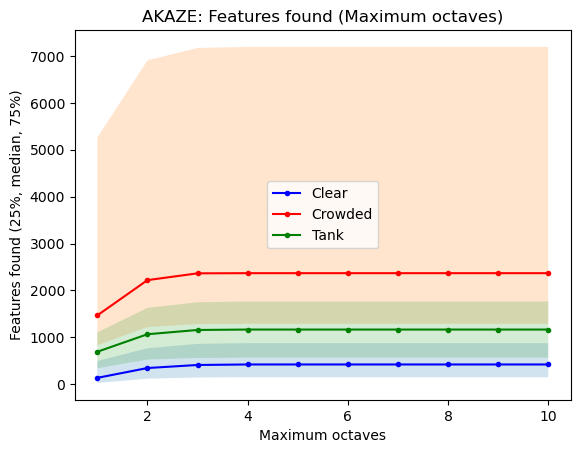

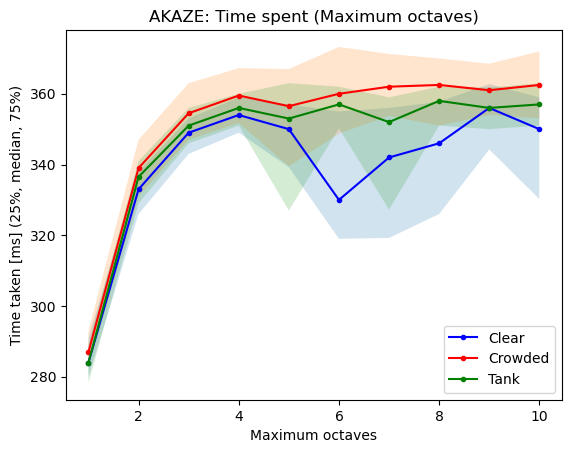

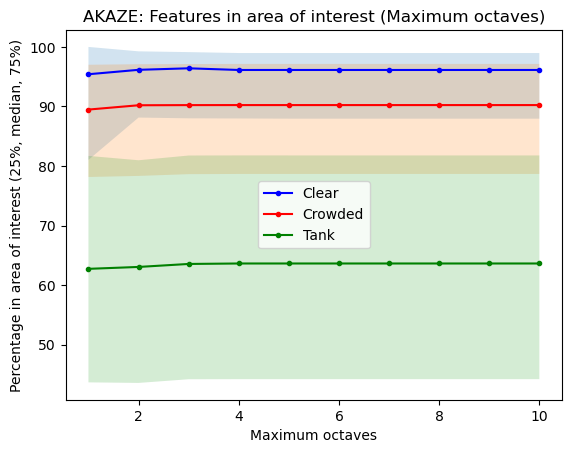

247.62085000000002
249.40445
250.18625
249.98905
249.98905
249.98905
249.98905
249.98905
249.98905
249.98905
The best median performance is at max octaves: 3 with a percentage sum of 250.18625


In [121]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
feature_environments = [all_feature_counts_clear,all_feature_counts_crowded,all_feature_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]

feature_medians, feature_25, feature_75 = find_median_and_quartiles(feature_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of features is plotted
line_graph_median_and_quantiles(max_octaves,feature_medians,feature_25,feature_75,environments, False, 'Maximum octaves', 'Features found (25%, median, 75%)', "AKAZE: Features found (Maximum octaves)", True,colors,"../Data/Graphs/AKAZE/AKAZE_features_max_octaves.png")

# Time taken is plotted
line_graph_median_and_quantiles(max_octaves,time_medians,time_25,time_75,environments, False, 'Maximum octaves', 'Time taken [ms] (25%, median, 75%)', "AKAZE: Time spent (Maximum octaves)", True,colors,"../Data/Graphs/AKAZE/AKAZE_time_max_octaves.png")

# Percentage is plotted
line_graph_median_and_quantiles(max_octaves,percentage_medians,percentage_25,percentage_75,environments, False, 'Maximum octaves', 'Percentage in area of interest (25%, median, 75%)', "AKAZE: Features in area of interest (Maximum octaves)", True,colors,"../Data/Graphs/AKAZE/AKAZE_percentage_max_octaves.png")

# Find layer with best median value
print_best(max_octaves,percentage_medians,"max octaves")

It can be seen that the crowded environment has a lot of spread, most likely due to the variance on what such dataset contains. It is also seen that only slight improvements in terms of feature count and ratio of features in areas of interest is seen above 2 maximum octaves. Time spent does as expected increase with maximum octaves until around four whereafter it becomes more sporadic. This most likely means that there is no need to go over four, since it is just a maximum and not the actual amount of octaves. A value of two might be enough in order to save on execution time without loosing much performance. 

### Octave sublevels

For the diffusivity tests all other parameters where kept constant at:<br>
Descriptor type: MLDB<br>
Descriptor size : 0 (Full size)<br>
Descriptor channels: 3<br>
Threshold: 0.0001<br>
Max octaves: 4 <br>
Diffusivity type: PM G2<br>

In [126]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
max_environment_tests = 4
octave_layers = [1,2,3,4,5,6,7,8,9,10]

# Get all file paths
for i in range(max_environment_tests):
    if(i < 3):
        path_clear = '../Data/Akaze/annotation/number_octave_layers_annotation_clear'+str(i+1)+'.csv'
        path_tank = '../Data/Akaze/annotation/number_octave_layers_annotation_tank'+str(i+1)+'.csv'
        paths_clear.append(path_clear)
        paths_tank.append(path_tank)
    if(i < 2):
        path_crowded = '../Data/Akaze/annotation/number_octave_layers_annotation_crowded'+str(i+1)+'.csv'
        paths_crowded.append(path_crowded)
    
# Extract desired information
all_feature_counts_clear, all_percentages_clear, all_time_counts_clear = read_annotation_results(paths_clear)
all_feature_counts_tank, all_percentages_tank, all_time_counts_tank = read_annotation_results(paths_tank)
all_feature_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_annotation_results(paths_crowded)

Check for valid samples

In [129]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["Octave layers","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers, octave_layers)

Clear:
┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Octave layers ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃               1 ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃              10 ┃             150 ┃             150 ┃        100.0000000 ┃
┗━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━━━━┛
Crowded:
┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Octave layers ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃               1 ┃             100 ┃             100 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃              10 ┃             100 ┃             100 ┃     

No influence on validity is seen

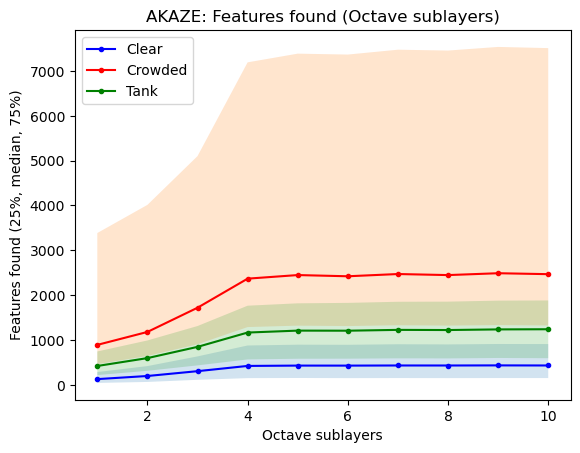

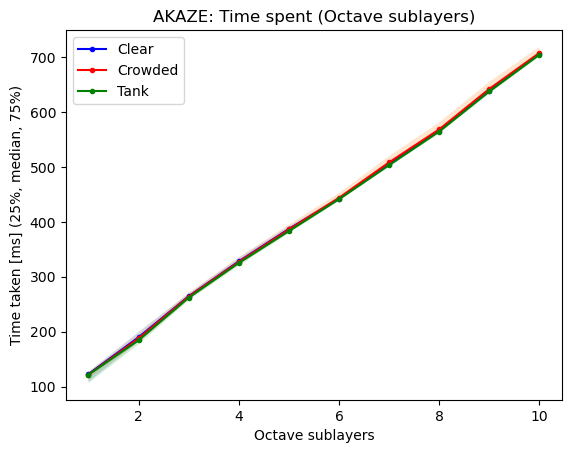

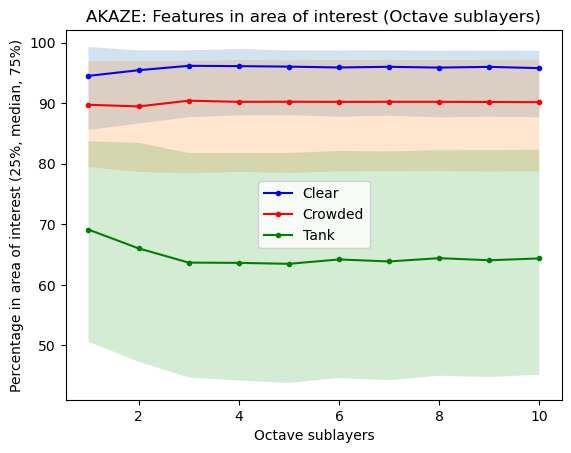

253.39024999999998
250.95714999999998
250.27695
249.98905
249.77085
250.32195
250.1207
250.529
250.267
250.3297
The best median performance is at octave sublayers: 1 with a percentage sum of 253.39024999999998


In [132]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
feature_environments = [all_feature_counts_clear,all_feature_counts_crowded,all_feature_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]


feature_medians, feature_25, feature_75 = find_median_and_quartiles(feature_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of features is plotted
line_graph_median_and_quantiles(octave_layers,feature_medians,feature_25,feature_75,environments, False, 'Octave sublayers', 'Features found (25%, median, 75%)', "AKAZE: Features found (Octave sublayers)", True,colors,"../Data/Graphs/AKAZE/AKAZE_features_octave_sublayers.png")

# Time taken is plotted
line_graph_median_and_quantiles(octave_layers,time_medians,time_25,time_75,environments, False, 'Octave sublayers', 'Time taken [ms] (25%, median, 75%)', "AKAZE: Time spent (Octave sublayers)", True,colors,"../Data/Graphs/AKAZE/AKAZE_time_octave_sublayers.png")

# Percentage is plotted
line_graph_median_and_quantiles(octave_layers,percentage_medians,percentage_25,percentage_75,environments, False, 'Octave sublayers', 'Percentage in area of interest (25%, median, 75%)', "AKAZE: Features in area of interest (Octave sublayers)", True,colors,"../Data/Graphs/AKAZE/AKAZE_percentage_octave_sublayers.png")

# Find layer with best median value
print_best(octave_layers,percentage_medians,"octave sublayers")

The number of octave sublayers is seen to greatly increase time spent in a linear fashion, while a growth limit sems to be reached around four sublayers.  The features found at lower sublayers seem to be evenly spread out since little change is seen in terms of features in area of interest, where only tank-based environments seem to attain more noise features. In order to limit time spent it might very well be beneficial to lower the sublyaers to three or even two. Three is however chosen due to more features being present in clear enviornments. 

## AKAZE match tests

### Descriptor type

In [137]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
max_environment_tests = 1
descriptor_types = ["KAZE", "MLDB"]

# Get all file paths
path_clear = '../Data/Akaze/matching/descriptor_type_matching_clear.csv'
path_tank = '../Data/Akaze/matching/descriptor_type_matching_tank.csv'
path_crowded = '../Data/Akaze/matching/descriptor_type_matching_crowded.csv'
paths_crowded.append(path_crowded)
paths_clear.append(path_clear)
paths_tank.append(path_tank)
    
# Extract desired information
all_match_counts_clear, all_percentages_clear, all_time_counts_clear = read_matching_results(paths_clear)
all_match_counts_tank, all_percentages_tank, all_time_counts_tank = read_matching_results(paths_tank)
all_match_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_matching_results(paths_crowded)

Check validity

In [140]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
environments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["Descriptor type","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers, descriptor_types)

Clear:
┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃ Descriptor type   ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ KAZE              ┃              99 ┃              99 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ MLDB              ┃              99 ┃              99 ┃        100.0000000 ┃
┗━━━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━━━━┛
Crowded:
┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃ Descriptor type   ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ KAZE              ┃              99 ┃              99 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ MLDB              ┃              9

No validity difference

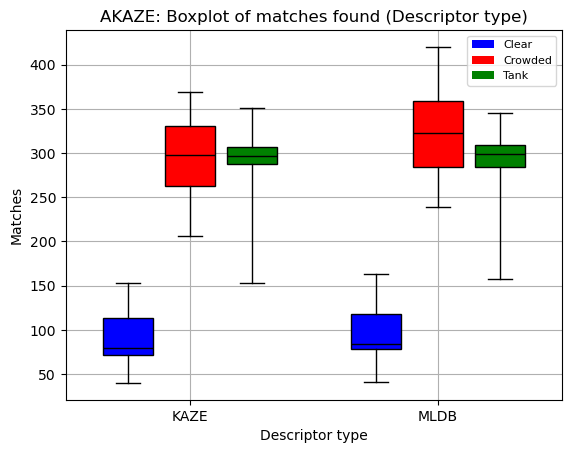

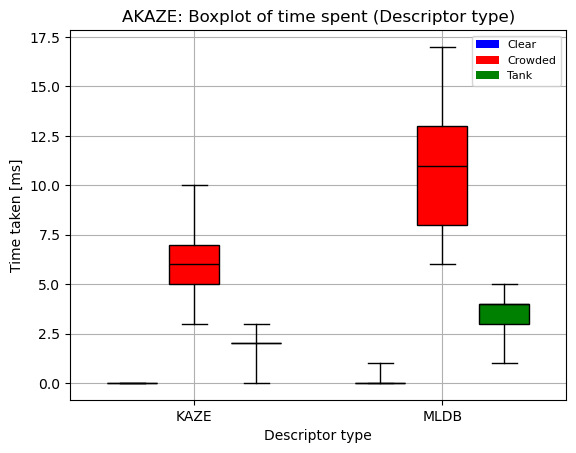

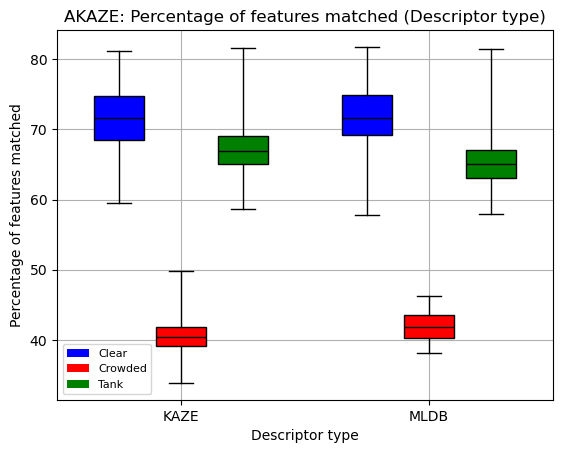

In [143]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import numpy as np
import statistics
import seaborn as sns
import pandas as pd

# Find medians and quantiles
match_environments = [all_match_counts_clear,all_match_counts_crowded,all_match_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean, all_percentages_tank_clean]

# Show boxplots
colors = ['b','r','g']
show_double_grouped_boxplots(environments,descriptor_types, match_environments, colors, 'Descriptor type', 'Matches','AKAZE: Boxplot of matches found (Descriptor type)',True,"../Data/Graphs/AKAZE/AKAZE_box_matches_descriptor_type.png")
show_double_grouped_boxplots(environments,descriptor_types, time_environments, colors, 'Descriptor type', 'Time taken [ms]','AKAZE: Boxplot of time spent (Descriptor type)',True,"../Data/Graphs/AKAZE/AKAZE_box_match_time_descriptor_type.png")
show_double_grouped_boxplots(environments,descriptor_types, percentage_environments, colors, 'Descriptor type', 'Percentage of features matched','AKAZE: Percentage of features matched (Descriptor type)',True,"../Data/Graphs/AKAZE/AKAZE_box_percentage_match_descriptor_type.png")


Write after i have figured out why tank time is so weird and why upright finds more features

### Descriptor size

In [147]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
max_environment_tests = 4
descriptor_sizes = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]

# Get all file paths
path_clear = '../Data/Akaze/matching/descriptor_size_matching_clear.csv'
path_tank = '../Data/Akaze/matching/descriptor_size_matching_tank.csv'
path_crowded = '../Data/Akaze/matching/descriptor_size_matching_crowded.csv'
paths_crowded.append(path_crowded)
paths_clear.append(path_clear)
paths_tank.append(path_tank)
    
# Extract desired information
all_match_counts_clear, all_percentages_clear, all_time_counts_clear = read_matching_results(paths_clear)
all_match_counts_tank, all_percentages_tank, all_time_counts_tank = read_matching_results(paths_tank)
all_match_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_matching_results(paths_crowded)

Check validity:

In [150]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["Descriptor size","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data, headers, descriptor_sizes)

Clear:
┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Descriptor size ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                 0 ┃              99 ┃              99 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                20 ┃              99 ┃              99 ┃        100.0000000 ┃
┗━━━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━━━━┛
Crowded:
┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Descriptor size ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                 0 ┃              99 ┃              99 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                20 ┃              9

No influence

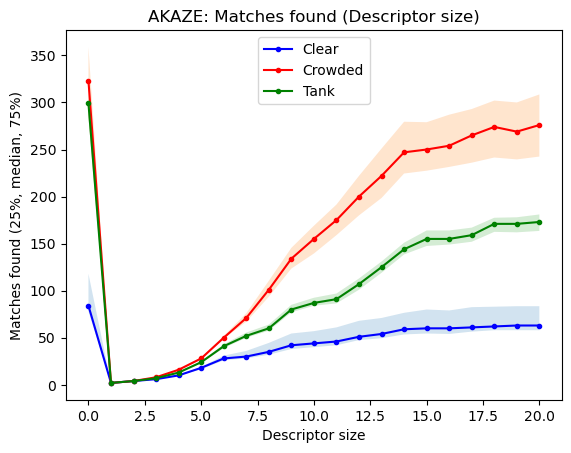

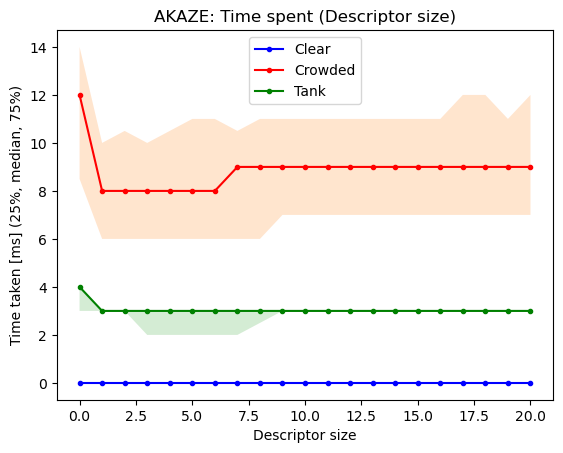

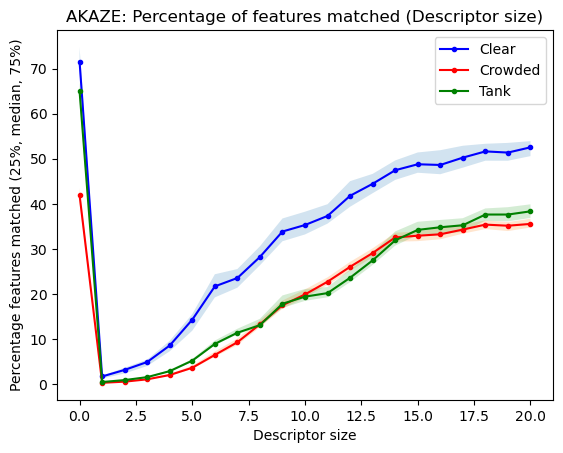

178.4894
2.35697
4.505602
7.42609
13.38794
23.06948
37.01202
44.174890000000005
54.5122
69.126
The best median performance is at Descriptor size: 1 with a percentage sum of 178.4894


In [153]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
match_environments = [all_match_counts_clear,all_match_counts_crowded,all_match_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]


match_medians, match_25, match_75 = find_median_and_quartiles(match_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of matches is plotted
line_graph_median_and_quantiles(descriptor_sizes,match_medians,match_25,match_75,environments, False, 'Descriptor size', 'Matches found (25%, median, 75%)', "AKAZE: Matches found (Descriptor size)", True,colors,"../Data/Graphs/AKAZE/AKAZE_matches_descriptor_size.png")

# Time taken is plotted
line_graph_median_and_quantiles(descriptor_sizes,time_medians,time_25,time_75,environments, False, 'Descriptor size', 'Time taken [ms] (25%, median, 75%)', "AKAZE: Time spent (Descriptor size)", True,colors,"../Data/Graphs/AKAZE/AKAZE_match_time_descriptor_size.png")

# Percentage is plotted
line_graph_median_and_quantiles(descriptor_sizes,percentage_medians,percentage_25,percentage_75,environments, False, 'Descriptor size', 'Percentage features matched (25%, median, 75%)', "AKAZE: Percentage of features matched (Descriptor size)", True,colors,"../Data/Graphs/AKAZE/AKAZE_match_percentage_descriptor_size.png")

# Find layer with best median value
print_best(octave_layers,percentage_medians,"Descriptor size")

Write stuff when understand

### Descriptor channels

In [157]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
max_environment_tests = 1
descriptor_channels = [1,2,3]

# Get all file paths
path_clear = '../Data/Akaze/matching/descriptor_channels_matching_clear.csv'
path_tank = '../Data/Akaze/matching/descriptor_channels_matching_tank.csv'
path_crowded = '../Data/Akaze/matching/descriptor_channels_matching_crowded.csv'
paths_crowded.append(path_crowded)
paths_clear.append(path_clear)
paths_tank.append(path_tank)
    
# Extract desired information
all_match_counts_clear, all_percentages_clear, all_time_counts_clear = read_matching_results(paths_clear)
all_match_counts_tank, all_percentages_tank, all_time_counts_tank = read_matching_results(paths_tank)
all_match_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_matching_results(paths_crowded)

check validity:

In [160]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["Descriptor channels","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data, headers, descriptor_channels)

Clear:
┏━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Descriptor channels ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                     1 ┃               0 ┃              99 ┃          0.0000000 ┃
┣━━━━━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                     3 ┃              99 ┃              99 ┃        100.0000000 ┃
┗━━━━━━━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━━━━┛
Crowded:
┏━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Descriptor channels ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                     1 ┃               0 ┃              99 ┃          0.0000000 ┃
┣━━━━━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━

Only three channels work due to BGR image

## Sift test:

The first feature detector tested is sift. All the parameters are tested in terms of number of features found, number of features that match the segmented image as well as the time it takes to find the features. During testing only the 1000 best features where kept, due to the fact that too many features would make everything slower as well as make it harder to detect any specific shape amongst them.

### Contrast threshold:

The variable that had the most imediate influence on the number of features detected was experienced to be the contrast threshold.
It was therefore the first variable that was tested. The remaining variable where kept constant at their advised/default values. Those being:<br>
Layers: 3<br>
Edge threshold: 10<br>
Sigma: 1.6<br>
With precise upscaling disabled.<br>

The recorded data can be categorized into three categories. Those being clear video feeds of only pillars, pillars located within tanks and pillars located in crowded environments. The different parameters are tested on each of these categories.<br>

Three videos where categorized as containing only a pillar in an empty underwater environment. From these a total of 150 frames, where taken and segmented for these tests. The frames where taken at an equal interval ensuring that frames from every part of the videos where used.<br>

Four videos where categorized as crowded environments, resulting in 200 frames being analysed. <br>

Three videos where categorized as being in a tank, resulting in 150 frames being analysed. <br>

The test therefore includes a total of 500 frames. <br>

Data is read:

In [167]:
import csv

# Paths
paths_clear = []
paths_match_clear = []
paths_crowded = []
paths_match_crowded = []
paths_tank = []
paths_match_tank = []

# Other variables
number_of_tests = 11
contrast_thresholds = [0.09, 0.08, 0.07, 0.06, 0.05, 0.04, 0.03, 0.02, 0.01, 0.009, 0.008]

# Get all file paths
for i in range(number_of_tests):
    path_clear = '../Data/Sift/Clear_Dataset/contrast_test_'+ str(i) +'_results.csv'
    path_match_clear = '../Data/Sift/Clear_Dataset/'+str(i)+'_contrast_match_results.csv'
    path_crowded = '../Data/Sift/Crowded_Dataset/contrast_test_'+ str(i) +'_results.csv'
    path_match_crowded = '../Data/Sift/Crowded_Dataset/'+str(i)+'_contrast_match_results.csv'
    path_tank = '../Data/Sift/Tank_Dataset/contrast_test_'+ str(i) +'_results.csv'
    path_match_tank = '../Data/Sift/Tank_Dataset/'+str(i)+'_contrast_match_results.csv'
    paths_clear.append(path_clear)
    paths_match_clear.append(path_match_clear)
    paths_crowded.append(path_crowded)
    paths_match_crowded.append(path_match_crowded)
    paths_tank.append(path_tank)
    paths_match_tank.append(path_match_tank)

# Extract desired information
all_feature_counts_clear, all_percentages_clear, all_time_counts_clear = read_segmentation_results(paths_clear,False,101)
all_feature_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_segmentation_results(paths_crowded,True,101)
all_feature_counts_tank, all_percentages_tank, all_time_counts_tank = read_segmentation_results(paths_tank,False,101)

all_match_counts_clear,all_match_percentages_clear = read_match_results(paths_match_clear)
all_match_counts_crowded,all_match_percentages_crowded = read_match_results(paths_match_crowded)
all_match_counts_tank,all_match_percentages_tank = read_match_results(paths_match_tank)

The first data of interest is the number of samples usable for each test. This is due to one of the test criteria being a percentage, which means samples with zero features present no valid percentage for analysis. Total samples, valid samples, contrast threshold and environment are therefore showcased in below table:

In [169]:
from tabulate import tabulate, SEPARATING_LINE
# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["contrast threshold","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers, contrast_thresholds)

Clear:
┏━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   contrast threshold ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃            0.0900000 ┃              46 ┃             150 ┃         30.6666667 ┃
┣━━━━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃            0.0800000 ┃              61 ┃             150 ┃         40.6666667 ┃
┣━━━━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃            0.0700000 ┃              73 ┃             150 ┃         48.6666667 ┃
┣━━━━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃            0.0600000 ┃              94 ┃             150 ┃         62.6666667 ┃
┣━━━━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃            0.0500000 ┃             111 ┃             150 ┃         74.0000000 ┃
┣━━━━━━━━

From these tables it can be seen that the clear dataset experience a big decrease in valid data samples, the higher the contrast threshold goes. This is due to many cases, where zero features are found. Since division by zero is illegal, the percentage results are invalid for these samples. This shows a very clear problem with using high value contrast thresholds in clear environments, but also means that the sample sizes will be skewed, when it comes to percentage measurements in the up comming analysis. The clear tests are also at some contrast threhsholds close to having a not statistical significant sample size (around 30 samples).<br>

The median, 25% and 75% percentile are now analysed for the three evaluation categories, that being features found, time taken, and percentage of features within segmented area. 

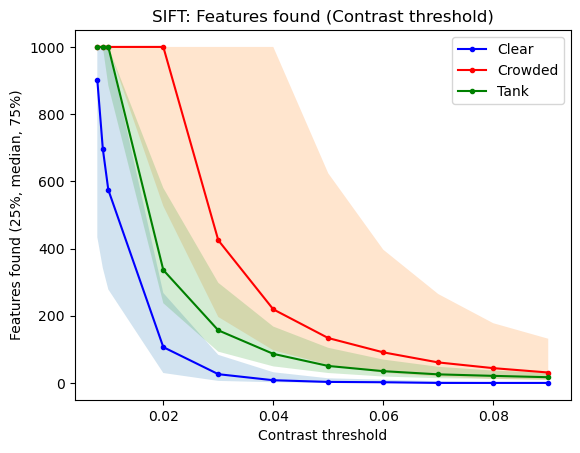

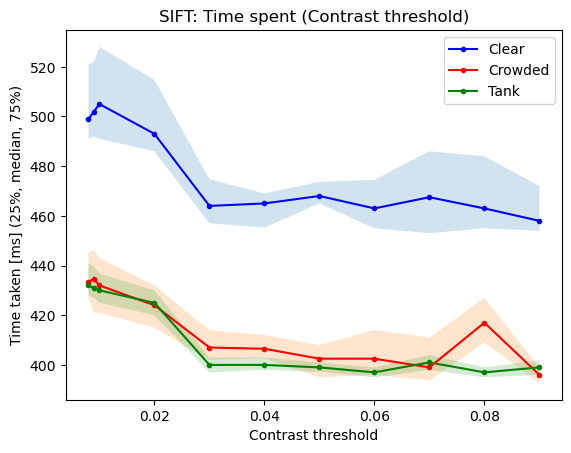

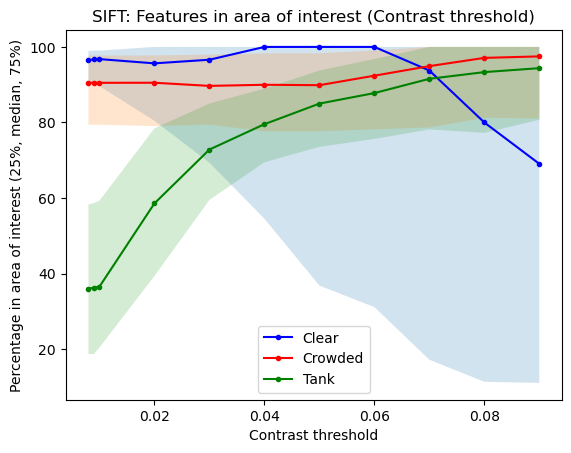

260.92269999999996
270.4347
280.22655
280.17875000000004
274.8718
269.53215
259.1342
244.7595
223.82905
223.4807
223.00485
The best median performance is at contrast thresholds: 0.07 with a percentage sum of 280.22655


In [171]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
feature_environments = [all_feature_counts_clear,all_feature_counts_crowded,all_feature_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]

feature_medians, feature_25, feature_75 = find_median_and_quartiles(feature_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of features is plotted
line_graph_median_and_quantiles(contrast_thresholds,feature_medians,feature_25,feature_75,environments, False, 'Contrast threshold', 'Features found (25%, median, 75%)', "SIFT: Features found (Contrast threshold)", True,colors,"../Data/Graphs/SIFT/SIFT_features_contrast_threshold.png")

# Time taken is plotted
line_graph_median_and_quantiles(contrast_thresholds,time_medians,time_25,time_75,environments, False, 'Contrast threshold', 'Time taken [ms] (25%, median, 75%)', "SIFT: Time spent (Contrast threshold)", True,colors,"../Data/Graphs/SIFT/SIFT_time_contrast_threshold.png")

# Percentage is plotted
line_graph_median_and_quantiles(contrast_thresholds,percentage_medians,percentage_25,percentage_75,environments, False, 'Contrast threshold', 'Percentage in area of interest (25%, median, 75%)', "SIFT: Features in area of interest (Contrast threshold)", True,colors,"../Data/Graphs/SIFT/SIFT_percentage_contrast_threshold.png")

# Find layer with best median value
print_best(contrast_thresholds,percentage_medians,"contrast thresholds")

The results show that the feature detector performs very differently depending on area type. Crowded areas produce the most amount of features at the cost of some accuracy in terms of percentage of features within the desired areas (pillars and protruding edges). It is also crowded areas that produce the most spread in terms of all test categories, most likely due to how different the crowded environments are to eachother compared to the more identical clear and tank environments. It is also the environment that seems the most stable in terms of features being located within the segmented areas, most likely due to the more spread distribution of features, due to various textures. It would therefore be beneficial to have high contrast thresholds in crowded environments since the removed features  dont seem to affect the median match percentage in a negative way.<br>

The tank environment sees the least amount of spread, most likely due to all the test environments being located within the same type of tank. It furthermore performs better in terms of feature count compared to the clear datasets. Reasons for this could be impurities in the concrete walls, the different color of the pipes (blue) or the increased clarity of the water. Looking at the segmentation results, it can be seen that the performance is increased with the increase in contrast threshold (and thus smaller amount of features). This indicate that only a couple of features are located on the pipes, but that these features are very clear. When decreasing the threshold more features will be found, but these will lie in the impurities of the background instead of on the desired pipes. The tank environment also seem to perform the fastest, even though more features are found. This might be due to the simplicity of the more static environment, or some difference in image sizes, which will be explored later. High contrast thresholds are therefore desired in tank environments, while still ensuring that a good amount of features are found. <br>

The clear environment clearly performs the worst in terms of feature counts, with many contrast threshold being unusable due to the tiny or no amount of features found. The results also indicate that the few features found at high contrast thresholds are likely to lie outside the desired areas. Only few features are however of high quality in the background, and thus increasing the amount of features found will increase the percentage of features being located as desired. This is in stark contrast to the tank environment. Low contrast thresholds are desired for clear environments, since it mostly just adds features in the desired areas.<br>

If only tank environment exists, a contrast threshold of 0.04 - 0.06 would probably be best, since it results in high segmentation match percentage, while still containing some features to work with.<br>

If only clear environments exists, a contrast threshold of 0.02-0.03 would be best, since high segmentation matching is present, while the feature count is not completly in the gutter. <br>

For this reasing it would be best to use either 0.03 or 0.04 in order to have high performance in all environments, while keeping the feature count existent for all environments. One would just have to keep fewer features in the complex environments. <br>

For future testing a contrast threshold of 0.02 is used, since this allows for more features being present, thus making it easier to see the affect of other changes. But the final implementation will be using a contrast threshold of 0.03. <br>

Some histograms will now be explored to analyse the high spread of crowded dataset, as well as the percentage spread for the clear dataset.

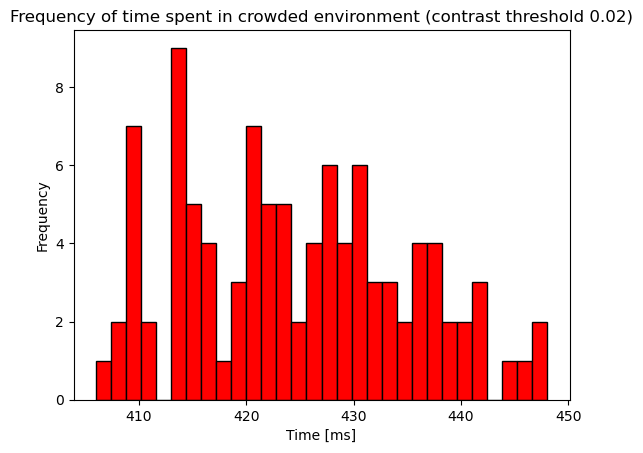

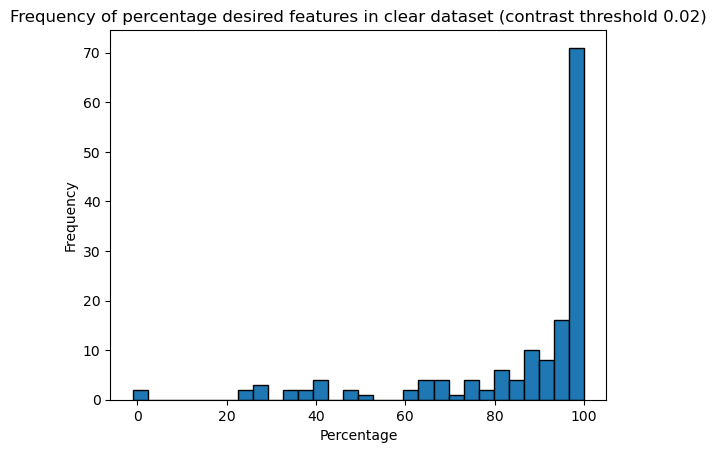

In [175]:
import matplotlib.pyplot as plt
import numpy as np

# Feature histotgram for crowded time
n_bins = 30
plt.hist(all_time_counts_crowded[7] ,bins=n_bins,color='r', density=False,edgecolor='black')
plt.xlabel('Time [ms]')
plt.ylabel('Frequency')
plt.title('Frequency of time spent in crowded environment (contrast threshold 0.02)')
plt.savefig("contrast_time_histogram.jpg")
plt.show()

# Feature histotgram for clear percentage
n_bins = 30
plt.hist(all_percentages_clear[7] ,bins=n_bins, density=False,edgecolor='black')
plt.xlabel('Percentage')
plt.ylabel('Frequency')
plt.title('Frequency of percentage desired features in clear dataset (contrast threshold 0.02)')
plt.savefig("contrast_percentage_histogram.jpg")
plt.show()



A clear difference is seen between the spread of the clear dataset, compared to that seen in the crowded dataset. There is a very clear cut between the low and high times in the crowded dataset, which indicates that something is different in the datasets. The difference was identified to be a difference in frame size between the crowded datasets. Two of which has a frame size of 2448 × 2058 (.mp4) and the other two having a frame size of 1920 × 1080 (.mkv). The clear data spread looks to be more consistent and have no difference in frame size. It is therefore likely just a result of some frames in the video feeds performing worse than others. <br>
Images of bad and good performance in the different environments can be seen bellow:

Text(0.5, 1.0, 'Tank environment (Bad)')

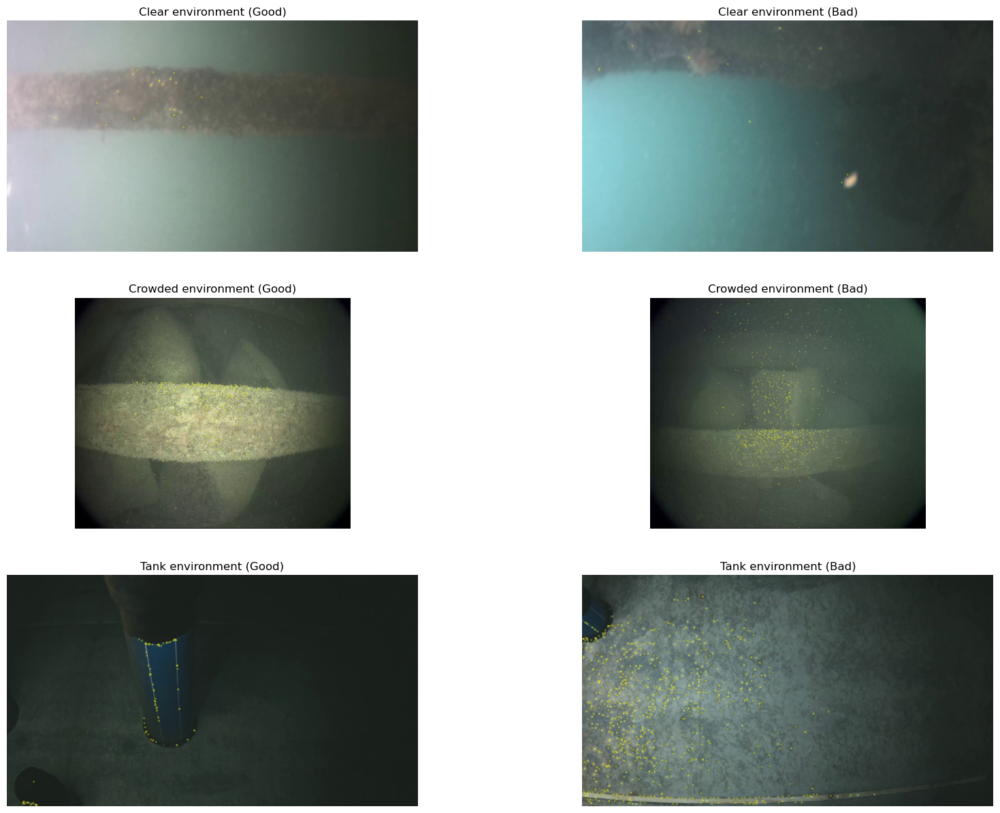

In [179]:
import cv2 
from matplotlib import pyplot as plt 

# figure 
image_figure = plt.figure(figsize=(20, 15))
rows = 3
columns = 2

# get images
clear_good = cv2.imread('../Data/feature_images/frame_normal_0.jpg',cv2.IMREAD_UNCHANGED)
clear_good = cv2.cvtColor(clear_good, cv2.COLOR_BGR2RGB)
clear_bad = cv2.imread('../Data/feature_images/frame_normal_45.jpg',cv2.IMREAD_UNCHANGED) 
clear_bad = cv2.cvtColor(clear_bad, cv2.COLOR_BGR2RGB)
crowded_good = cv2.imread('../Data/feature_images/frame_normal_crowded_17.jpg',cv2.IMREAD_UNCHANGED)
crowded_good = cv2.cvtColor(crowded_good, cv2.COLOR_BGR2RGB)
crowded_bad = cv2.imread('../Data/feature_images/frame_normal_crowded_12.jpg',cv2.IMREAD_UNCHANGED)
crowded_bad = cv2.cvtColor(crowded_bad, cv2.COLOR_BGR2RGB)
tank_good = cv2.imread('../Data/feature_images/frame_normal_tank_18.jpg',cv2.IMREAD_UNCHANGED)
tank_good = cv2.cvtColor(tank_good, cv2.COLOR_BGR2RGB)
tank_bad = cv2.imread('../Data/feature_images/frame_normal_tank_1.jpg',cv2.IMREAD_UNCHANGED)
tank_bad = cv2.cvtColor(tank_bad, cv2.COLOR_BGR2RGB)

# add images to figure
image_figure.add_subplot(rows, columns, 1)
plt.imshow(clear_good) 
plt.axis('off') 
plt.title("Clear environment (Good)") 

image_figure.add_subplot(rows, columns, 2)
plt.imshow(clear_bad) 
plt.axis('off') 
plt.title("Clear environment (Bad)")

image_figure.add_subplot(rows, columns, 3)
plt.imshow(crowded_good) 
plt.axis('off') 
plt.title("Crowded environment (Good)") 

image_figure.add_subplot(rows, columns, 4)
plt.imshow(crowded_bad) 
plt.axis('off') 
plt.title("Crowded environment (Bad)")

image_figure.add_subplot(rows, columns, 5)
plt.imshow(tank_good) 
plt.axis('off') 
plt.title("Tank environment (Good)")

image_figure.add_subplot(rows, columns, 6)
plt.imshow(tank_bad) 
plt.axis('off') 
plt.title("Tank environment (Bad)") 


From these images we can identify what causes the error features in each test environment. In the clear environment, specs of organic material floating in the water might cause false readings as well as light reflecting of other sedements moved by the flow of water. <br>

In the crowded environment, other objects in the frame result in most false readings, especially if the objects are closer or as close to the camera as the pillars themselves. Low light also seem to allow for impurities/shadows to be caught as features. <br>

In the tank environment, the miscolourisation of the concrete backdrop as well as connection lines between plates produce alot of false readings, especially in good lighting. The problem is mitigated by being further away from the backdrop and having slightly less light. <br>

## Edge threshold

The edge threshold is used to filter out edge features. The larger the value, the more edge-like features will be retained, while lower values will filter them away.

The remaining variable where kept constant at the following values:<br>
Layers: 3<br>
Contrast threshold: 0.02<br>
Sigma: 1.6<br>
With precise upscaling disabled.<br>

In [183]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
number_of_tests = 60
edge_thresholds = []
for i in range(number_of_tests):
    edge_thresholds.append(i+1)

# Get all file paths
for i in range(number_of_tests):
    path_clear = '../Data/Sift/Clear_Dataset/edge_test_'+ str(i) +'_results.csv'
    path_crowded = '../Data/Sift/Crowded_Dataset/edge_test_'+ str(i) +'_results.csv'
    path_tank = '../Data/Sift/Tank_Dataset/edge_test_'+ str(i) +'_results.csv'
    paths_clear.append(path_clear)
    paths_crowded.append(path_crowded)
    paths_tank.append(path_tank)

# Extract desired information
all_feature_counts_clear, all_percentages_clear, all_time_counts_clear = read_segmentation_results(paths_clear,False,101)
all_feature_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_segmentation_results(paths_crowded,True,101)
all_feature_counts_tank, all_percentages_tank, all_time_counts_tank = read_segmentation_results(paths_tank,False,101)

In [184]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["edge threshold","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers, edge_thresholds)

Clear:
┏━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   edge threshold ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                1 ┃               0 ┃             150 ┃          0.0000000 ┃
┣━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                2 ┃             146 ┃             150 ┃         97.3333333 ┃
┣━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                3 ┃             147 ┃             150 ┃         98.0000000 ┃
┣━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                4 ┃             148 ┃             150 ┃         98.6666667 ┃
┣━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                8 ┃             148 ┃             150 ┃         98.6666667 ┃
┣━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━

The percentage data for edge thresholds of one are unusable, since no valid samples exists. It can however be seen that almost all other values reach approximately 100 percent validity. Results from the edge threshold of one are ignored for testing purposes.

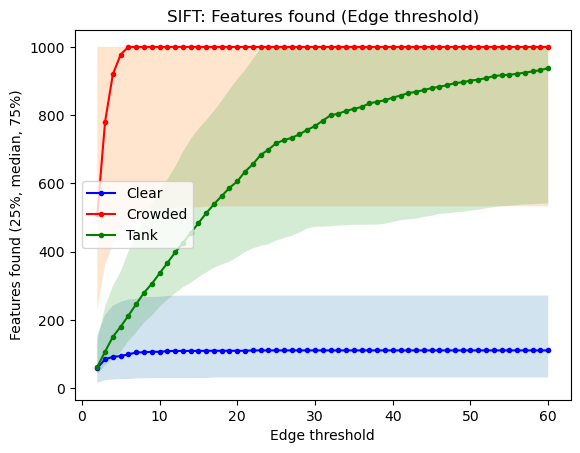

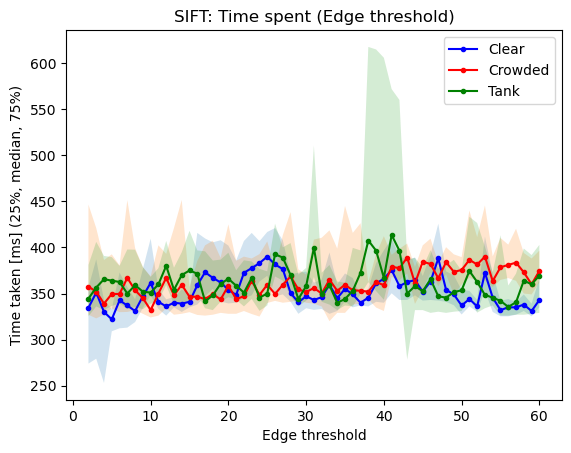

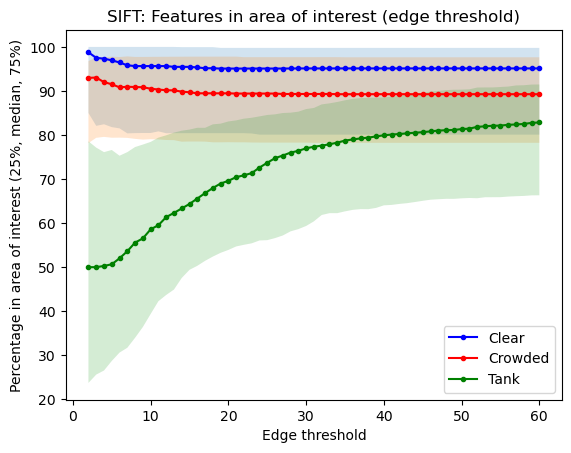

241.74215
240.57105
239.60645
239.142
239.30110000000002
240.39639999999997
242.1285
243.02929999999998
244.7595
245.5059
247.17365
247.92989999999998
248.64799999999997
249.52614999999997
250.39620000000002
251.44115
252.60305
253.53715
254.1565
254.93574999999998
255.34285
255.859
257.1187
258.2052
259.2552
259.75035
260.4289
260.8404
261.4085
261.77025000000003
262.0221
262.32975
262.65250000000003
263.1264
263.37775
263.62305000000003
263.79600000000005
264.07975
264.3301
264.49555
264.6218
264.7673
264.9104
265.03495
265.21450000000004
265.3927
265.48135
265.53135
265.73135
265.8387
266.2383
266.3637
266.49325
266.53240000000005
266.70185000000004
266.78830000000005
266.9001
267.14685000000003
267.2383
The best median performance is at edge threshold: 60 with a percentage sum of 267.2383


In [186]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Remove edge threshold 1 results, because invalid:
edge_thresholds = []
for i in range(number_of_tests):
    if(i > 0):
        edge_thresholds.append(i+1)

# Find medians and quantiles
feature_environments = [all_feature_counts_clear,all_feature_counts_crowded,all_feature_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]

feature_medians, feature_25, feature_75 = find_median_and_quartiles(feature_environments,1)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments,1)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments,1)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of features is plotted
line_graph_median_and_quantiles(edge_thresholds,feature_medians,feature_25,feature_75,environments, False, 'Edge threshold', 'Features found (25%, median, 75%)', "SIFT: Features found (Edge threshold)", True,colors,"../Data/Graphs/SIFT/SIFT_features_edge_threshold.png")

# Time taken is plotted
line_graph_median_and_quantiles(edge_thresholds,time_medians,time_25,time_75,environments, False, 'Edge threshold', 'Time taken [ms] (25%, median, 75%)', "SIFT: Time spent (Edge threshold)", True,colors,"../Data/Graphs/SIFT/SIFT_time_edge_threshold.png")

# Percentage is plotted
line_graph_median_and_quantiles(edge_thresholds,percentage_medians,percentage_25,percentage_75,environments, False, 'Edge threshold', 'Percentage in area of interest (25%, median, 75%)', "SIFT: Features in area of interest (edge threshold)", True,colors,"../Data/Graphs/SIFT/SIFT_percentage_edge_threshold.png")

# Find layer with best median value
print_best(edge_thresholds,percentage_medians,"edge threshold")

The tendency of increasing the edge threshold leads to increased number of features is clearly seen in this analysis. The crowded environment hits saturation very fast, with no diviance from the 1000 features. The clear environment also hits its own saturation fast, reaching a point where the percentiles and median seem to stabalise. The tank envionment keeps increasing without hitting its saturation. The time analysis is as stable for all test environment as the contrast threshold tests. <br>

The accuracy of the desired features also seem to stabalise somewhat for both clear and crowded environments, however with a slight decrease. The tank environment however see a stark increase in accuracy with the increase in edge threshold, likely due to the very line-likes stribes on the pipes within the environment. <br>

When choosing an edge threshold, it is important to focus on the accuracy but also if removing outliers is possible. From this analysis alone it seems that the best compromise is having a high edge threshold, since the increase in accuracy for the tank environment out shines the decrease in both the clear and crowded environments. A quick analysis of the spread in the tank environment percentages will be performed. 

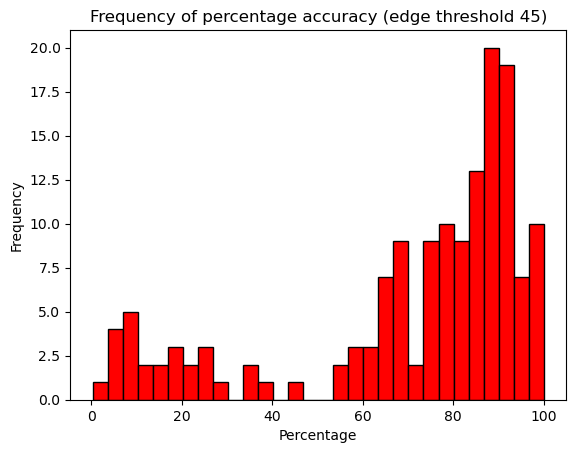

In [188]:
# Feature histotgram for tank percentages
n_bins = 30
plt.hist(all_percentages_tank[45] ,bins=n_bins,color='r', density=False,edgecolor='black')
plt.xlabel('Percentage')
plt.ylabel('Frequency')
plt.title('Frequency of percentage accuracy (edge threshold 45)')
plt.savefig("edge_percentage_histogram.jpg")
plt.show()

Here it seems that there is a slight split between frames performing well and frames performing badly. This is most likely due to some frames containing very little of the desired structures. This will make it more likely that false readings outnumber desired features. Images of the features detected using a small (five), medium (30) and high (60) edge thresholds are analysed to determine if having an increased edge threshold is benefical. 

Text(0.5, 1.0, 'Crowded environment (High)')

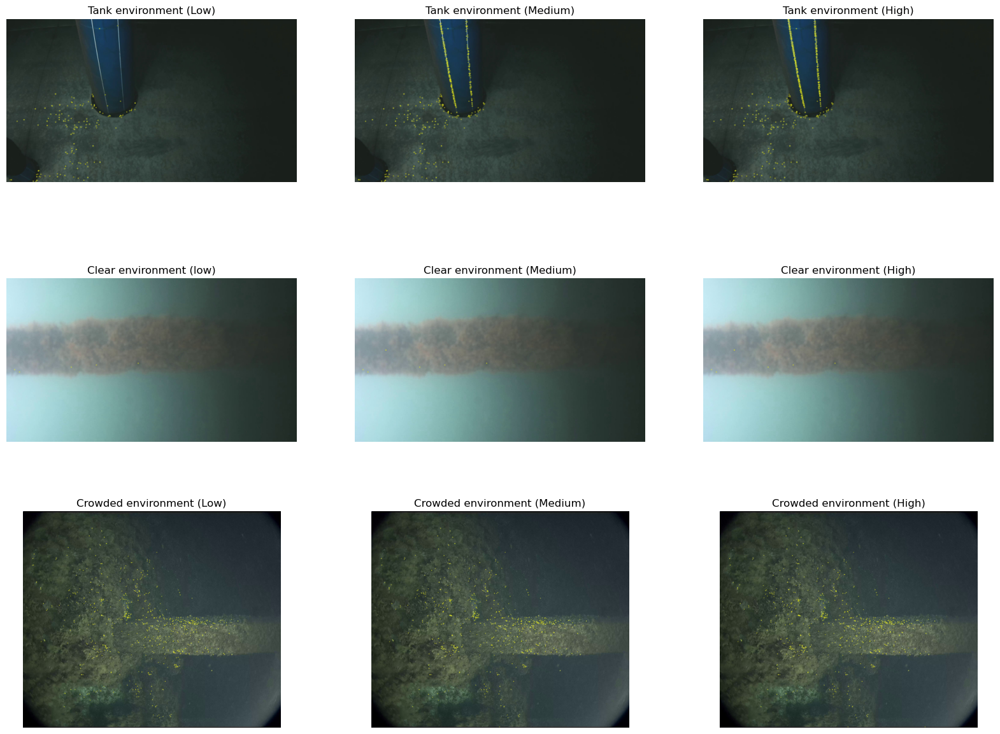

In [191]:
import cv2 
from matplotlib import pyplot as plt 

# figure 
image_figure = plt.figure(figsize=(20, 15))
rows = 3
columns = 3

# get images
tank_low = cv2.imread('../Data/feature_images/edge_low_frame_normal_tank_13.jpg',cv2.IMREAD_UNCHANGED)
tank_low = cv2.cvtColor(tank_low, cv2.COLOR_BGR2RGB)
tank_medium = cv2.imread('../Data/feature_images/edge_medium_frame_normal_tank_13.jpg',cv2.IMREAD_UNCHANGED)
tank_medium = cv2.cvtColor(tank_medium, cv2.COLOR_BGR2RGB)
tank_high = cv2.imread('../Data/feature_images/edge_high_frame_normal_tank_13.jpg',cv2.IMREAD_UNCHANGED)
tank_high = cv2.cvtColor(tank_high, cv2.COLOR_BGR2RGB)

clear_low = cv2.imread('../Data/feature_images/edge_low_frame_normal_clear_22.jpg',cv2.IMREAD_UNCHANGED)
clear_low = cv2.cvtColor(clear_low, cv2.COLOR_BGR2RGB)
clear_medium = cv2.imread('../Data/feature_images/edge_medium_frame_normal_clear_22.jpg',cv2.IMREAD_UNCHANGED)
clear_medium = cv2.cvtColor(clear_medium, cv2.COLOR_BGR2RGB)
clear_high = cv2.imread('../Data/feature_images/edge_high_frame_normal_clear_22.jpg',cv2.IMREAD_UNCHANGED)
clear_high = cv2.cvtColor(clear_high, cv2.COLOR_BGR2RGB)

crowded_low = cv2.imread('../Data/feature_images/edge_low_frame_normal_crowded_32.jpg',cv2.IMREAD_UNCHANGED)
crowded_low = cv2.cvtColor(crowded_low, cv2.COLOR_BGR2RGB)
crowded_medium = cv2.imread('../Data/feature_images/edge_medium_frame_normal_crowded_32.jpg',cv2.IMREAD_UNCHANGED)
crowded_medium = cv2.cvtColor(crowded_medium, cv2.COLOR_BGR2RGB)
crowded_high = cv2.imread('../Data/feature_images/edge_high_frame_normal_crowded_32.jpg',cv2.IMREAD_UNCHANGED)
crowded_high = cv2.cvtColor(crowded_high, cv2.COLOR_BGR2RGB)

# add images to figure
image_figure.add_subplot(rows, columns, 1)
plt.imshow(tank_low) 
plt.axis('off') 
plt.title("Tank environment (Low)") 

image_figure.add_subplot(rows, columns, 2)
plt.imshow(tank_medium) 
plt.axis('off') 
plt.title("Tank environment (Medium)")

image_figure.add_subplot(rows, columns, 3)
plt.imshow(tank_high) 
plt.axis('off') 
plt.title("Tank environment (High)")

image_figure.add_subplot(rows, columns, 4)
plt.imshow(clear_low) 
plt.axis('off') 
plt.title("Clear environment (low)")

image_figure.add_subplot(rows, columns, 5)
plt.imshow(clear_medium) 
plt.axis('off') 
plt.title("Clear environment (Medium)")

image_figure.add_subplot(rows, columns, 6)
plt.imshow(clear_high) 
plt.axis('off') 
plt.title("Clear environment (High)")

image_figure.add_subplot(rows, columns, 7)
plt.imshow(crowded_low) 
plt.axis('off') 
plt.title("Crowded environment (Low)")

image_figure.add_subplot(rows, columns, 8)
plt.imshow(crowded_medium) 
plt.axis('off') 
plt.title("Crowded environment (Medium)")

image_figure.add_subplot(rows, columns, 9)
plt.imshow(crowded_high) 
plt.axis('off') 
plt.title("Crowded environment (High)")


From these images, the results can be explained quite well. The tank environment performs better since the pipes themselves contain lines, that can be used to identify them. The noise of the background is however very far from line structures meaning that increasing the line threshold will add more features to the pipes than it will add in other places. The other two environments see little change. Only a couple of features are added, some on the pillars themselves but also some on undesired objects, keeping the percentage of desired features somewhat stable. Because of this the best choice for a multi-environment system is an edge threshold of around 43.

## Layers

The number of layers determines at how many scales we analyse the image. The value used in the official paper is 3. The number of octaves is calculated automatically by OpenCV using the image resolution. The idea is that using more layers will increased to quality of the features since they will be more scale invariant.

The remaining variable where kept constant at the following values:<br>
Edge threshold: 43<br>
Contrast threshold: 0.02<br>
Sigma: 1.6<br>
With precise upscaling disabled.<br>

In [197]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
number_of_tests = 10
layers = []
for i in range(number_of_tests):
    layers.append(i+1)

# Get all file paths
for i in range(number_of_tests):
    path_clear = '../Data/Sift/Clear_Dataset/layer_test_'+ str(i) +'_results.csv'
    path_crowded = '../Data/Sift/Crowded_Dataset/layer_test_'+ str(i) +'_results.csv'
    path_tank = '../Data/Sift/Tank_Dataset/layer_test_'+ str(i) +'_results.csv'
    paths_clear.append(path_clear)
    paths_crowded.append(path_crowded)
    paths_tank.append(path_tank)

# Extract desired information
all_feature_counts_clear, all_percentages_clear, all_time_counts_clear = read_segmentation_results(paths_clear,False,101)
all_feature_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_segmentation_results(paths_crowded,True,101)
all_feature_counts_tank, all_percentages_tank, all_time_counts_tank = read_segmentation_results(paths_tank,False,101)

In [198]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["layers","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers, layers)

Clear:
┏━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   layers ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃        1 ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃        4 ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃        5 ┃             149 ┃             150 ┃         99.3333333 ┃
┣━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃        8 ┃             149 ┃             150 ┃         99.3333333 ┃
┣━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃        9 ┃             148 ┃             150 ┃         98.6666667 ┃
┣━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃       10 ┃             150 ┃             150 ┃        100.0000000 ┃
┗━━━━━━━━━━┻━

Almost complete validity can be seen. Only at some high number of layers the clear dataset looses a couple of frames.

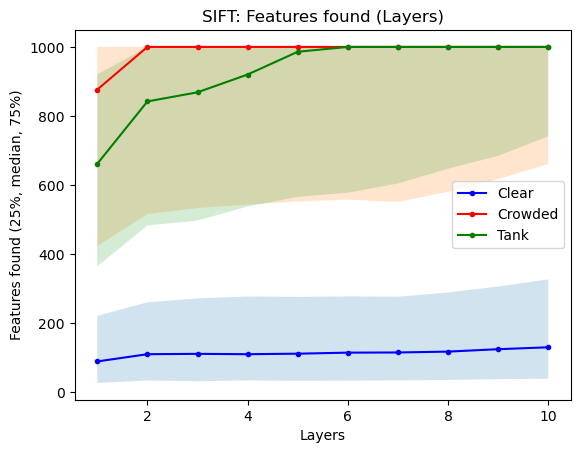

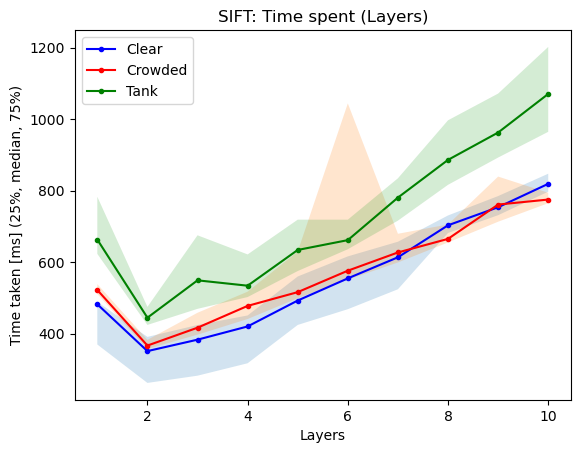

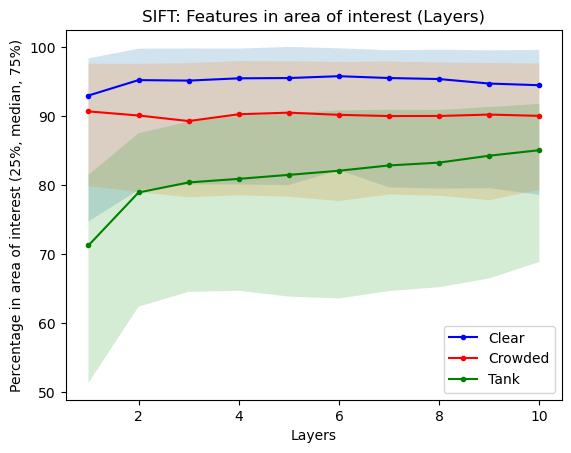

254.88600000000002
264.19194999999996
264.7673
266.6042
267.4546
268.00419999999997
268.32855
268.60125
269.15235
269.5241
The best median performance is at layer: 10 with a percentage sum of 269.5241


In [202]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
feature_environments = [all_feature_counts_clear,all_feature_counts_crowded,all_feature_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]

feature_medians, feature_25, feature_75 = find_median_and_quartiles(feature_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of features is plotted
line_graph_median_and_quantiles(layers,feature_medians,feature_25,feature_75,environments, False, 'Layers', 'Features found (25%, median, 75%)', "SIFT: Features found (Layers)", True,colors,"../Data/Graphs/SIFT/SIFT_features_layers.png")

# Time taken is plotted
line_graph_median_and_quantiles(layers,time_medians,time_25,time_75,environments, False, 'Layers', 'Time taken [ms] (25%, median, 75%)', "SIFT: Time spent (Layers)", True,colors,"../Data/Graphs/SIFT/SIFT_time_layers.png")

# Percentage is plotted
line_graph_median_and_quantiles(layers,percentage_medians,percentage_25,percentage_75,environments, False, 'Layers', 'Percentage in area of interest (25%, median, 75%)', "SIFT: Features in area of interest (Layers)", True,colors,"../Data/Graphs/SIFT/SIFT_percentage_layers.png")

# Find layer with best median value
print_best(layers,percentage_medians,"layer")

These results show that the amount of features in the tank envrionment can easily be increased with the increase in layers, while the other environments remain stable. It can also be seen that the time will increase with the increase in the number of layers used. This holds for all datasets. The percentage of correct features seems to decrease for the crowded environment and increase in the tank environment. It however seem that the ideal position is a three layers, since this is where the crowded and tank performances cross. The best performing layer in terms of total median percentage is however layer 10, but it is desired that all environments have good performance. There is again an immense split in the performance of the crowded environment. Which will be analysed in a histogram.

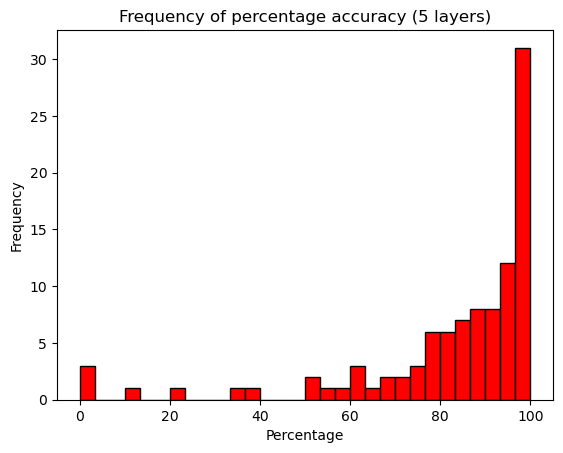

In [204]:
# Feature histotgram for crowded percentages
n_bins = 30
plt.hist(all_percentages_crowded[4] ,bins=n_bins,color='r', density=False,edgecolor='black')
plt.xlabel('Percentage')
plt.ylabel('Frequency')
plt.title('Frequency of percentage accuracy (5 layers)')
plt.savefig("layer_percentage_histogram.jpg")
plt.show()

Some frames seem to perform very badly compared to others. Images of all datasets with 5 layers with good and bad results are analysed.

Text(0.5, 1.0, 'Tank environment (Bad)')

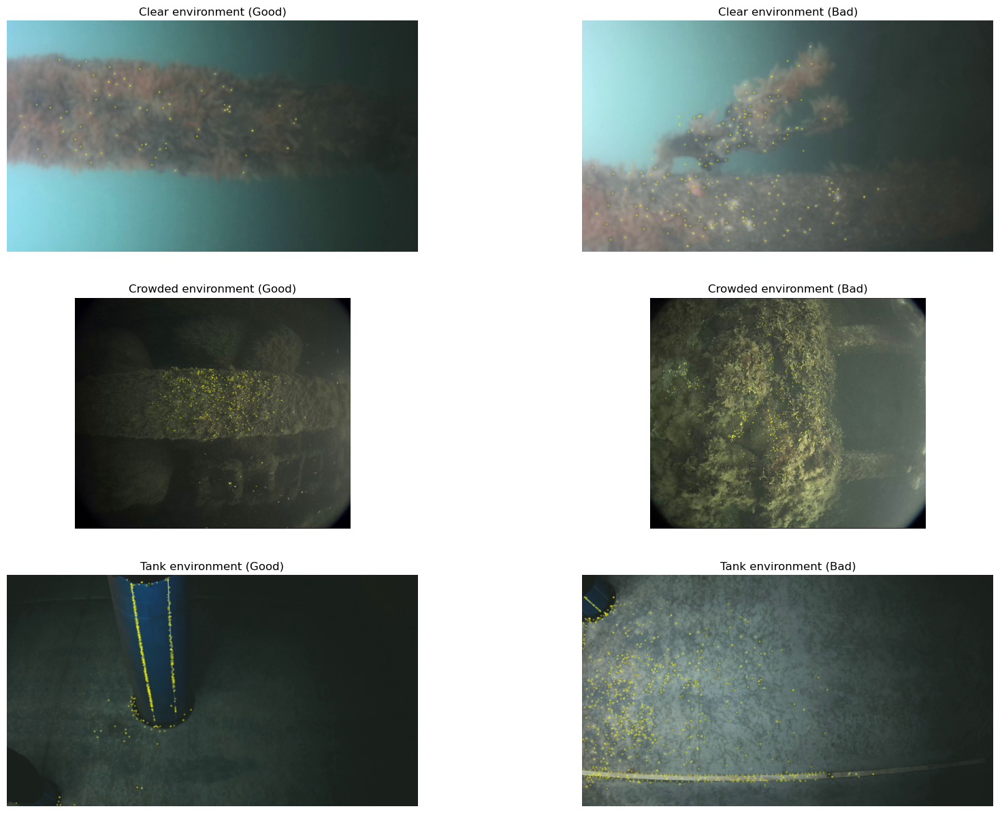

In [206]:
import cv2 
from matplotlib import pyplot as plt 

# figure 
image_figure = plt.figure(figsize=(20, 15))
rows = 3
columns = 2

# get images
clear_bad = cv2.imread('../Data/feature_images/layers_frame_normal_clear_37.jpg',cv2.IMREAD_UNCHANGED)
clear_bad = cv2.cvtColor(clear_bad, cv2.COLOR_BGR2RGB)
clear_good = cv2.imread('../Data/feature_images/layers_frame_normal_clear_28.jpg',cv2.IMREAD_UNCHANGED) 
clear_good = cv2.cvtColor(clear_good, cv2.COLOR_BGR2RGB)

crowded_good = cv2.imread('../Data/feature_images/layers_frame_normal_crowded_2_3.jpg',cv2.IMREAD_UNCHANGED)
crowded_good = cv2.cvtColor(crowded_good, cv2.COLOR_BGR2RGB)
crowded_bad = cv2.imread('../Data/feature_images/layers_frame_normal_crowded_5.jpg',cv2.IMREAD_UNCHANGED)
crowded_bad = cv2.cvtColor(crowded_bad, cv2.COLOR_BGR2RGB)

tank_good = cv2.imread('../Data/feature_images/layers_frame_normal_tank_14.jpg',cv2.IMREAD_UNCHANGED)
tank_good = cv2.cvtColor(tank_good, cv2.COLOR_BGR2RGB)
tank_bad = cv2.imread('../Data/feature_images/layers_frame_normal_tank_0.jpg',cv2.IMREAD_UNCHANGED)
tank_bad = cv2.cvtColor(tank_bad, cv2.COLOR_BGR2RGB)

# add images to figure
image_figure.add_subplot(rows, columns, 1)
plt.imshow(clear_good) 
plt.axis('off') 
plt.title("Clear environment (Good)") 

image_figure.add_subplot(rows, columns, 2)
plt.imshow(clear_bad) 
plt.axis('off') 
plt.title("Clear environment (Bad)")

image_figure.add_subplot(rows, columns, 3)
plt.imshow(crowded_good) 
plt.axis('off') 
plt.title("Crowded environment (Good)") 

image_figure.add_subplot(rows, columns, 4)
plt.imshow(crowded_bad) 
plt.axis('off') 
plt.title("Crowded environment (Bad)")

image_figure.add_subplot(rows, columns, 5)
plt.imshow(tank_good) 
plt.axis('off') 
plt.title("Tank environment (Good)")

image_figure.add_subplot(rows, columns, 6)
plt.imshow(tank_bad) 
plt.axis('off') 
plt.title("Tank environment (Bad)") 


Here many universal reasons for high deviation are showcased. The tank environment has images with very little pipe in them, having the backdrop and its impurities be lighted and in the foreground. Some crowded datasets has the pillars located further back, which creates problems for the feature detection. In the clear envrionment, some images have organic matter pertruding from the pillars themselves, which creates alot of false readings. This seems to be the case no matter the settings used so far. The only thing seen is that these bad frames are limited in their degree at only one layer. A layer of three is however kept to keep the median percentage around 80 percent for all environments. 

## Sigma

Sigma is the standard deviation used, when applying the gaussian. It is usually recomended that lower values should be used for softer camera lenses. The recomended value is 1.6, but values from 0.5 to 3.5 will be explored. <be>

The remaining variable where kept constant at the following values:<br>
Edge threshold: 43<br>
Contrast threshold: 0.02<br>
Layers: 3<br>
With precise upscaling disabled.<br>

In [210]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
number_of_tests = 31
sigmas = []
sigma = 0.5
for i in range(number_of_tests):
    sigmas.append(sigma)
    sigma = sigma+0.1

# Get all file paths
for i in range(number_of_tests):
    path_clear = '../Data/Sift/Clear_Dataset/sigma_test_'+ str(i) +'_results.csv'
    path_crowded = '../Data/Sift/Crowded_Dataset/sigma_test_'+ str(i) +'_results.csv'
    path_tank = '../Data/Sift/Tank_Dataset/sigma_test_'+ str(i) +'_results.csv'
    paths_clear.append(path_clear)
    paths_crowded.append(path_crowded)
    paths_tank.append(path_tank)

# Extract desired information
all_feature_counts_clear, all_percentages_clear, all_time_counts_clear = read_segmentation_results(paths_clear,False,101)
all_feature_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_segmentation_results(paths_crowded,True,101)
all_feature_counts_tank, all_percentages_tank, all_time_counts_tank = read_segmentation_results(paths_tank,False,101)

In [212]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["sigma","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers, sigmas)

Clear:
┏━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃     sigma ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ 0.5000000 ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ 0.6000000 ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ 0.7000000 ┃             149 ┃             150 ┃         99.3333333 ┃
┣━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ 0.8000000 ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ 0.9000000 ┃             148 ┃             150 ┃         98.6666667 ┃
┣━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ 1.0000000 ┃             149 ┃             150 ┃         99.3333333 ┃

Gaussian standard deviations bellow 0.3 will not work for underwater purposes, since no features are ever found.

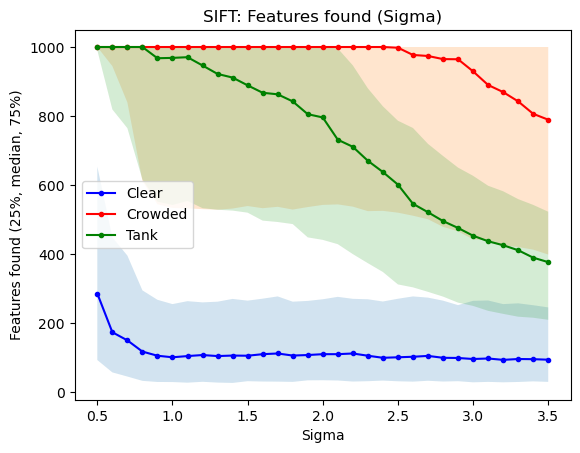

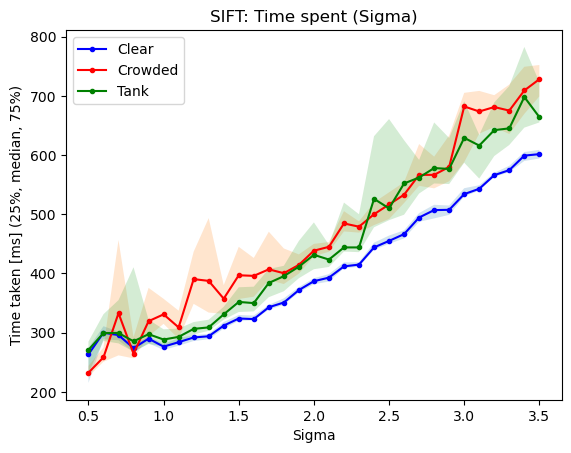

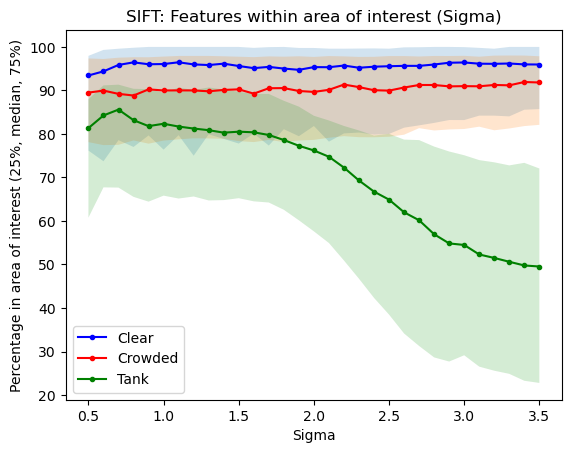

264.2964
268.59645
270.67060000000004
268.45525
268.05735000000004
268.40395
268.18085
267.22665
266.50469999999996
266.5707
266.3823
264.7673
265.68215
264.1719
261.8918
261.22749999999996
260.23580000000004
259.3373
255.28515000000002
252.25145
250.4289
248.32135
247.0604
244.16125
242.14105
241.90565
239.39685000000003
238.87914999999998
237.9842
237.6978
237.31980000000001
The best median performance is at sigma: 0.7 with a percentage sum of 270.67060000000004


In [216]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
feature_environments = [all_feature_counts_clear,all_feature_counts_crowded,all_feature_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]

feature_medians, feature_25, feature_75 = find_median_and_quartiles(feature_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of features is plotted
line_graph_median_and_quantiles(sigmas,feature_medians,feature_25,feature_75,environments, False, 'Sigma', 'Features found (25%, median, 75%)', "SIFT: Features found (Sigma)", True,colors,"../Data/Graphs/SIFT/SIFT_features_sigma.png")

# Time taken is plotted
line_graph_median_and_quantiles(sigmas,time_medians,time_25,time_75,environments, False, 'Sigma', 'Time taken [ms] (25%, median, 75%)', "SIFT: Time spent (Sigma)", True,colors,"../Data/Graphs/SIFT/SIFT_time_sigma.png")

# Percentage is plotted
line_graph_median_and_quantiles(sigmas,percentage_medians,percentage_25,percentage_75,environments, False, 'Sigma', 'Percentage in area of interest (25%, median, 75%)', "SIFT: Features within area of interest (Sigma)", True,colors,"../Data/Graphs/SIFT/SIFT_percentage_sigma.png")

# Find layer with best median value
print_best(sigmas,percentage_medians,"sigma")

Increasing the standard deviation can be seen to decrease the amount of features found in tank environments and with this worsening the the percentage accuracy of the tank environment, since the "good" features are removed. Increasing sigma also makes the process take more time. The crowded environment increases slightly in accuracy with the increase in sigma, while also lowering in deviation. These results present two possible choices. The one that creates the best overall results are 0.7, while the one that ensures that all environments are valued equally at 1.5-1.6. Since many of the obstacles in the crowded environment represent other places to avoid even though they are not pillars, i will be inclined to choose sigma 0.7. I will now analyse images of low (0.7), medium (1.6) and high (3.0) sigma values.

Text(0.5, 1.0, 'Crowded environment (High)')

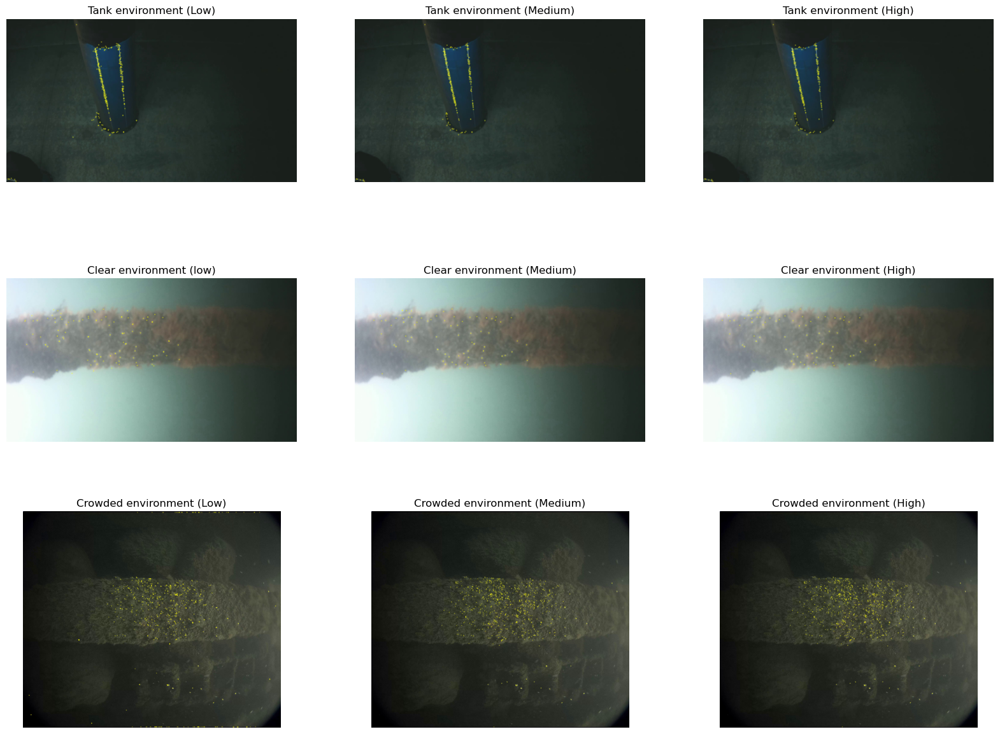

In [220]:
import cv2 
from matplotlib import pyplot as plt 

# figure 
image_figure = plt.figure(figsize=(20, 15))
rows = 3
columns = 3

# get images
tank_low = cv2.imread('../Data/feature_images/sigma_low_frame_normal_tank_16.jpg',cv2.IMREAD_UNCHANGED)
tank_low = cv2.cvtColor(tank_low, cv2.COLOR_BGR2RGB)
tank_medium = cv2.imread('../Data/feature_images/sigma_medium_frame_normal_tank_16.jpg',cv2.IMREAD_UNCHANGED)
tank_medium = cv2.cvtColor(tank_medium, cv2.COLOR_BGR2RGB)
tank_high = cv2.imread('../Data/feature_images/sigma_high_frame_normal_tank_16.jpg',cv2.IMREAD_UNCHANGED)
tank_high = cv2.cvtColor(tank_high, cv2.COLOR_BGR2RGB)

clear_low = cv2.imread('../Data/feature_images/sigma_low_frame_normal_clear_12.jpg',cv2.IMREAD_UNCHANGED)
clear_low = cv2.cvtColor(clear_low, cv2.COLOR_BGR2RGB)
clear_medium = cv2.imread('../Data/feature_images/sigma_medium_frame_normal_clear_12.jpg',cv2.IMREAD_UNCHANGED)
clear_medium = cv2.cvtColor(clear_medium, cv2.COLOR_BGR2RGB)
clear_high = cv2.imread('../Data/feature_images/sigma_high_frame_normal_clear_12.jpg',cv2.IMREAD_UNCHANGED)
clear_high = cv2.cvtColor(clear_high, cv2.COLOR_BGR2RGB)

crowded_low = cv2.imread('../Data/feature_images/sigma_low_frame_normal_crowded_3.jpg',cv2.IMREAD_UNCHANGED)
crowded_low = cv2.cvtColor(crowded_low, cv2.COLOR_BGR2RGB)
crowded_medium = cv2.imread('../Data/feature_images/sigma_medium_frame_normal_crowded_3.jpg',cv2.IMREAD_UNCHANGED)
crowded_medium = cv2.cvtColor(crowded_medium, cv2.COLOR_BGR2RGB)
crowded_high = cv2.imread('../Data/feature_images/sigma_high_frame_normal_crowded_3.jpg',cv2.IMREAD_UNCHANGED)
crowded_high = cv2.cvtColor(crowded_high, cv2.COLOR_BGR2RGB)

# add images to figure
image_figure.add_subplot(rows, columns, 1)
plt.imshow(tank_low) 
plt.axis('off') 
plt.title("Tank environment (Low)") 

image_figure.add_subplot(rows, columns, 2)
plt.imshow(tank_medium) 
plt.axis('off') 
plt.title("Tank environment (Medium)")

image_figure.add_subplot(rows, columns, 3)
plt.imshow(tank_high) 
plt.axis('off') 
plt.title("Tank environment (High)")

image_figure.add_subplot(rows, columns, 4)
plt.imshow(clear_low) 
plt.axis('off') 
plt.title("Clear environment (low)")

image_figure.add_subplot(rows, columns, 5)
plt.imshow(clear_medium) 
plt.axis('off') 
plt.title("Clear environment (Medium)")

image_figure.add_subplot(rows, columns, 6)
plt.imshow(clear_high) 
plt.axis('off') 
plt.title("Clear environment (High)")

image_figure.add_subplot(rows, columns, 7)
plt.imshow(crowded_low) 
plt.axis('off') 
plt.title("Crowded environment (Low)")

image_figure.add_subplot(rows, columns, 8)
plt.imshow(crowded_medium) 
plt.axis('off') 
plt.title("Crowded environment (Medium)")

image_figure.add_subplot(rows, columns, 9)
plt.imshow(crowded_high) 
plt.axis('off') 
plt.title("Crowded environment (High)")


Here we see the influence of sigma. In the tank environment low sigma results in more features where pillars are connected to other objects. These are counted as valid but many of them are not needed for identification. In terms of the clear environment a couple of features disapear from the pillar, but nothing significant. In the crowded environment low sigma results in the edge of the image being seen as pillars, which is undesirable. For these reasons the value of sigma is kept at 1.6.

## Precise upscaling

Precise upscaling is used to prevent localisation bias at the cost of processing time. The effects on this specific scenario will be analysed. <br>

The remaining variable where kept constant at the following values: <br>
Edge threshold: 43 <br>
Contrast threshold: 0.02 <br>
Layers: 3 <br>
Sigma: 1.6 <br>

In [224]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
number_of_tests = 2
upscale = ["True","False"]
# Get all file paths
for i in range(number_of_tests):
    path_clear = '../Data/Sift/Clear_Dataset/upscale_test_'+ str(i) +'_results.csv'
    path_crowded = '../Data/Sift/Crowded_Dataset/upscale_test_'+ str(i) +'_results.csv'
    path_tank = '../Data/Sift/Tank_Dataset/upscale_test_'+ str(i) +'_results.csv'
    paths_clear.append(path_clear)
    paths_crowded.append(path_crowded)
    paths_tank.append(path_tank)

# Extract desired information
all_feature_counts_clear, all_percentages_clear, all_time_counts_clear = read_segmentation_results(paths_clear,False,101)
all_feature_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_segmentation_results(paths_crowded,True,101)
all_feature_counts_tank, all_percentages_tank, all_time_counts_tank = read_segmentation_results(paths_tank,False,101)

In [225]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["precise upscale","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers, upscale)

Clear:
┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃ precise upscale   ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ True              ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ False             ┃             150 ┃             150 ┃        100.0000000 ┃
┗━━━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━━━━┛
Crowded:
┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃ precise upscale   ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ True              ┃             100 ┃             100 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ False             ┃             10

Precise upscaling is seen to have no effect on the number of valid samples.

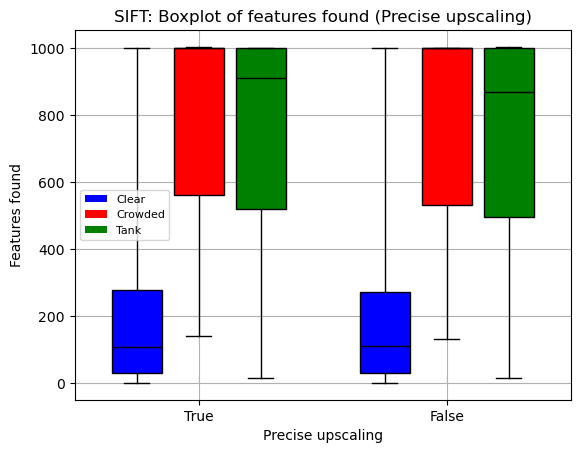

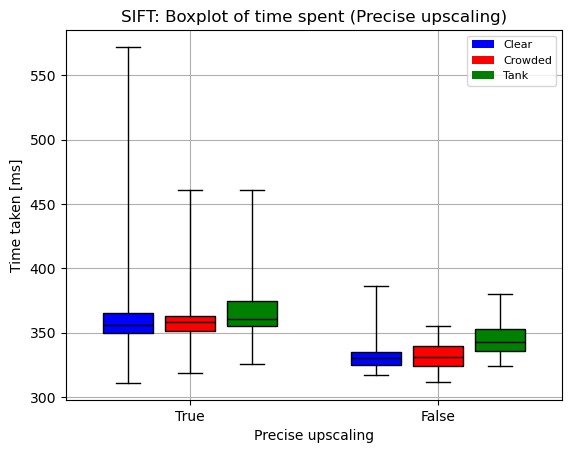

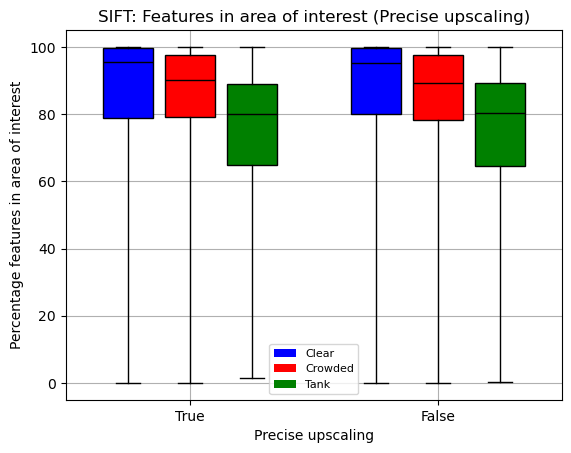

In [228]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
feature_environments = [all_feature_counts_clear,all_feature_counts_crowded,all_feature_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]

environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

show_double_grouped_boxplots(enviroments,upscale, feature_environments, colors, 'Precise upscaling', 'Features found','SIFT: Boxplot of features found (Precise upscaling)',True,"../Data/Graphs/SIFT/SIFT_box_features_upscale.png")
show_double_grouped_boxplots(enviroments,upscale, time_environments, colors, 'Precise upscaling', 'Time taken [ms]','SIFT: Boxplot of time spent (Precise upscaling)',True,"../Data/Graphs/SIFT/SIFT_box_time_upscale.png")
show_double_grouped_boxplots(enviroments,upscale, percentage_environments, colors, 'Precise upscaling', 'Percentage features in area of interest','SIFT: Features in area of interest (Precise upscaling)',True,"../Data/Graphs/SIFT/SIFT_box_percentage_upscale.png")


Very little change happens between having precise upscaling enabled or disabled. Having it disabled will slightly increase processing time and increase success rate in the tank environment, while lowering it for the crowded environment. Since almost no change occur it will be kept disabled. 

The final settings are thus: <br>
Edge threshold: 43 <br>
Contrast threshold: 0.03 <br>
Layers: 3 <br>
Sigma: 1.6 <br>
With precise upscaling disabled.<br>

## ORB test:

The second feature detector tested is ORB. All the parameters are tested in terms of number of features found, number of features that match the segmented image as well as the time it takes to find the features. During testing only the 1000 best features where kept, due to the fact that too many features would make everything slower as well as make it harder to detect any specific shape amongst them.

### Scale factor:

The scale factor represents the decimation ratio. It has a value above one and below 2. <br>

The remaining variable where kept constant at the following values: <br>
Levels: 8<br>
Edge threshold: 31<br>
Start level: 0<br>
Points in element: 2<br>
Patch size: 31<br>
Fast threshold: 20<br>

In [238]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
number_of_tests = 9
scale = []
current_scale = 1.1
for i in range(number_of_tests):
    scale.append(current_scale)
    current_scale = current_scale+0.1
    
# Get all file paths
for i in range(number_of_tests):
    path_clear = '../Data/Orb/Clear_Dataset/scale_'+ str(i) +'_results.csv'
    path_crowded = '../Data/Orb/Crowded_Dataset/scale_'+ str(i) +'_results.csv'
    path_tank = '../Data/Orb/Tank_Dataset/scale_'+ str(i) +'_results.csv'
    paths_clear.append(path_clear)
    paths_crowded.append(path_crowded)
    paths_tank.append(path_tank)

# Extract desired information
all_feature_counts_clear, all_percentages_clear, all_time_counts_clear = read_segmentation_results(paths_clear,False,101)
all_feature_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_segmentation_results(paths_crowded,True,101)
all_feature_counts_tank, all_percentages_tank, all_time_counts_tank = read_segmentation_results(paths_tank,False,101)

In [239]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["Scale factor","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers, scale)

Clear:
┏━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Scale factor ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃      1.1000000 ┃              83 ┃             150 ┃         55.3333333 ┃
┣━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃      1.2000000 ┃             108 ┃             150 ┃         72.0000000 ┃
┣━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃      1.3000000 ┃             114 ┃             150 ┃         76.0000000 ┃
┣━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃      1.4000000 ┃             120 ┃             150 ┃         80.0000000 ┃
┣━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃      1.5000000 ┃             121 ┃             150 ┃         80.6666667 ┃
┣━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃    

Alot of data is lost in the clear environment at low scale factors, indicating that a scale factor above 1.4 should be used.

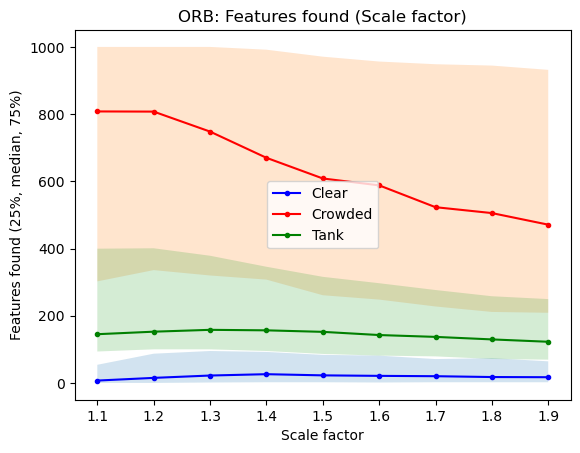

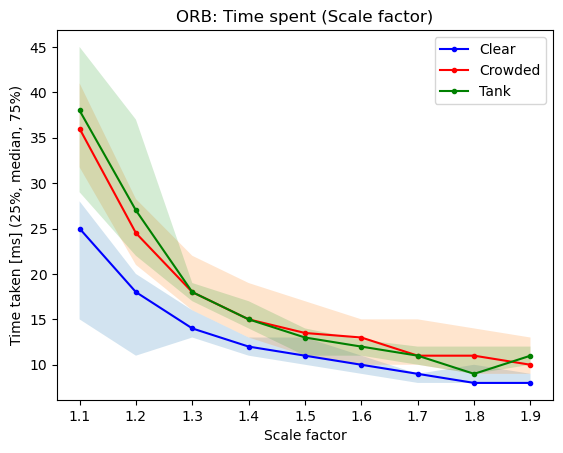

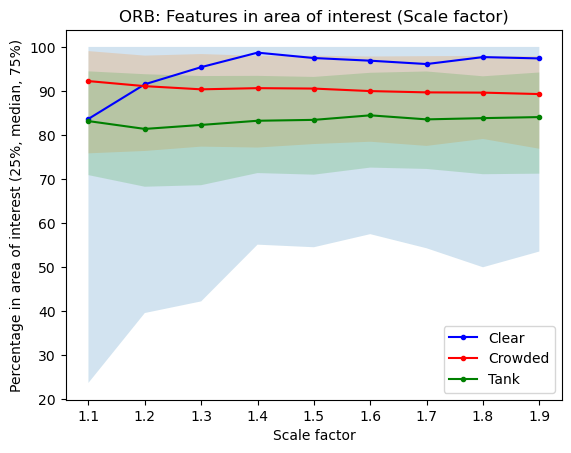

259.08934999999997
264.01779999999997
268.08665
272.5921
271.47425
271.3304
269.35975
271.16175
270.77425
The best median performance is at scale factor: 1.4000000000000004 with a percentage sum of 272.5921


In [241]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
feature_environments = [all_feature_counts_clear,all_feature_counts_crowded,all_feature_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]

feature_medians, feature_25, feature_75 = find_median_and_quartiles(feature_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of features is plotted
line_graph_median_and_quantiles(scale,feature_medians,feature_25,feature_75,environments, False, 'Scale factor', 'Features found (25%, median, 75%)', "ORB: Features found (Scale factor)", True,colors,"../Data/Graphs/ORB/ORB_features_scale_factor.png")

# Time taken is plotted
line_graph_median_and_quantiles(scale,time_medians,time_25,time_75,environments, False, 'Scale factor', 'Time taken [ms] (25%, median, 75%)', "ORB: Time spent (Scale factor)", True,colors,"../Data/Graphs/ORB/ORB_time_scale_factor.png")

# Percentage is plotted
line_graph_median_and_quantiles(scale,percentage_medians,percentage_25,percentage_75,environments, False, 'Scale factor', 'Percentage in area of interest (25%, median, 75%)', "ORB: Features in area of interest (Scale factor)", True,colors,"../Data/Graphs/ORB/ORB_percentage_scale_factor.png")

# Find layer with best median value
print_best(scale,percentage_medians,"scale factor")

In terms of features found, the scale factor seem to have little influence. The deviation of both the clear and tank environments shrink with the increase in scale factor, while the devation of the crowded environment increases. Scale factors bellow 1.3 also present a big issue in terms of too few features being found in clear environments. <br>

In terms of time, increasing the scale factor, decreases the time needed for all environments. The biggest influence is going from 1.1 to 1.3. <br>

The percentage match also acts quite stabaly, with the clear environment increasing up to a scale factor of 1.4, whereafter it stabalises a bit. The other environments are quite stable from the get go. This indicates that the scale factor should have a value of 1.4 or above. Since the median percentage sum is biggest at 1.6, that is the value that will be used. This is higher than the standard value of 1.2. <br>

Images of a scale factor of 1.2 will now be compared to 1.6. <br>

Text(0.5, 1.0, 'Tank environment (1.2 scale factor)')

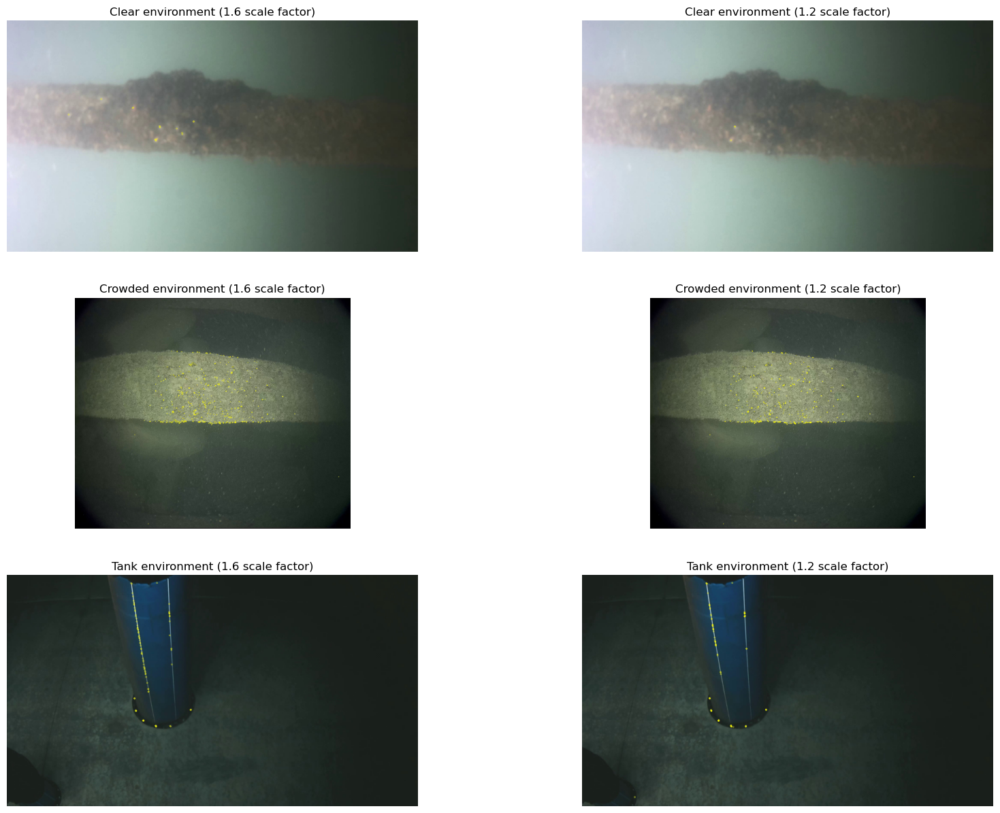

In [243]:
import cv2 
from matplotlib import pyplot as plt 

# figure 
image_figure = plt.figure(figsize=(20, 15))
rows = 3
columns = 2

# get images
clear_bad = cv2.imread('../Data/Orb/Images/scale_low_frame_normal_clear_5.jpg',cv2.IMREAD_UNCHANGED)
clear_bad = cv2.cvtColor(clear_bad, cv2.COLOR_BGR2RGB)
clear_good = cv2.imread('../Data/Orb/Images/scale_high_frame_normal_clear_5.jpg',cv2.IMREAD_UNCHANGED) 
clear_good = cv2.cvtColor(clear_good, cv2.COLOR_BGR2RGB)

crowded_bad = cv2.imread('../Data/Orb/Images/scale_low_frame_normal_crowded_23.jpg',cv2.IMREAD_UNCHANGED)
crowded_bad = cv2.cvtColor(crowded_bad, cv2.COLOR_BGR2RGB)
crowded_good = cv2.imread('../Data/Orb/Images/scale_high_frame_normal_crowded_23.jpg',cv2.IMREAD_UNCHANGED)
crowded_good = cv2.cvtColor(crowded_good, cv2.COLOR_BGR2RGB)

tank_bad = cv2.imread('../Data/Orb/Images/scale_low_frame_normal_tank_14.jpg',cv2.IMREAD_UNCHANGED)
tank_bad = cv2.cvtColor(tank_bad, cv2.COLOR_BGR2RGB)
tank_good = cv2.imread('../Data/Orb/Images/scale_high_frame_normal_tank_14.jpg',cv2.IMREAD_UNCHANGED)
tank_good = cv2.cvtColor(tank_good, cv2.COLOR_BGR2RGB)

# add images to figure
image_figure.add_subplot(rows, columns, 1)
plt.imshow(clear_good) 
plt.axis('off') 
plt.title("Clear environment (1.6 scale factor)") 

image_figure.add_subplot(rows, columns, 2)
plt.imshow(clear_bad) 
plt.axis('off') 
plt.title("Clear environment (1.2 scale factor)")

image_figure.add_subplot(rows, columns, 3)
plt.imshow(crowded_good) 
plt.axis('off') 
plt.title("Crowded environment (1.6 scale factor)") 

image_figure.add_subplot(rows, columns, 4)
plt.imshow(crowded_bad) 
plt.axis('off') 
plt.title("Crowded environment (1.2 scale factor)")

image_figure.add_subplot(rows, columns, 5)
plt.imshow(tank_good) 
plt.axis('off') 
plt.title("Tank environment (1.6 scale factor)")

image_figure.add_subplot(rows, columns, 6)
plt.imshow(tank_bad) 
plt.axis('off') 
plt.title("Tank environment (1.2 scale factor)") 


From these images it is seen that many features disapear in the clear environment, when lowering the scale factor, while little change is seen in the crowded environment. The tank environment also seem to lose some features, but since many are present to start with the removal of some is less critical. The increase in scale factor also dont seem to add "false" features, which means that a scale factor of 1.6 is viable.

### Levels:

The number of levels used will also be tested in an area around the standard value of 8 <br>

The remaining variable where kept constant at the following values: <br>
Scale factor: 1.6<br>
Edge threshold: 31<br>
Start level: 0<br>
Points in element: 2<br>
Patch size: 31<br>
Fast threshold: 20<br>

In [247]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
number_of_tests = 17
level = []
current_level = 1
for i in range(number_of_tests):
    level.append(current_level)
    current_level = current_level+1
    
# Get all file paths
for i in range(number_of_tests):
    path_clear = '../Data/Orb/Clear_Dataset/level_'+ str(i) +'_results.csv'
    path_crowded = '../Data/Orb/Crowded_Dataset/level_'+ str(i) +'_results.csv'
    path_tank = '../Data/Orb/Tank_Dataset/level_'+ str(i) +'_results.csv'
    paths_clear.append(path_clear)
    paths_crowded.append(path_crowded)
    paths_tank.append(path_tank)

# Extract desired information
all_feature_counts_clear, all_percentages_clear, all_time_counts_clear = read_segmentation_results(paths_clear,False,101)
all_feature_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_segmentation_results(paths_crowded,True,101)
all_feature_counts_tank, all_percentages_tank, all_time_counts_tank = read_segmentation_results(paths_tank,False,101)

In [249]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["Levels","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers, level)

Clear:
┏━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Levels ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃        1 ┃              76 ┃             150 ┃         50.6666667 ┃
┣━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃        2 ┃              89 ┃             150 ┃         59.3333333 ┃
┣━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃        3 ┃             102 ┃             150 ┃         68.0000000 ┃
┣━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃        4 ┃             113 ┃             150 ┃         75.3333333 ┃
┣━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃        5 ┃             121 ┃             150 ┃         80.6666667 ┃
┣━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃        6 ┃             123 ┃             150 ┃         82.0000000 ┃
┣━━━━━━━━━━╋━

Any number of layers below six will decrease the number of valid samples. Increasing it will not improve the number of valid samples.

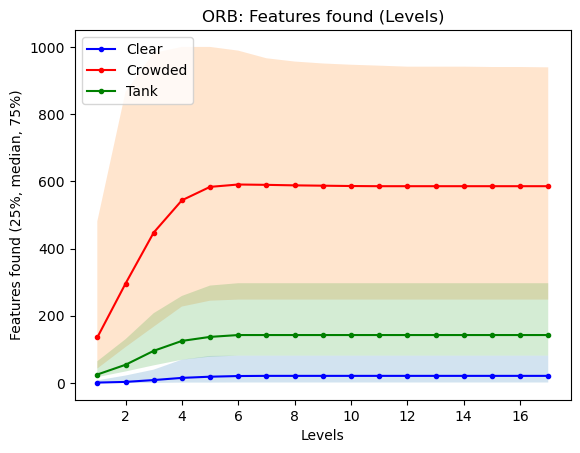

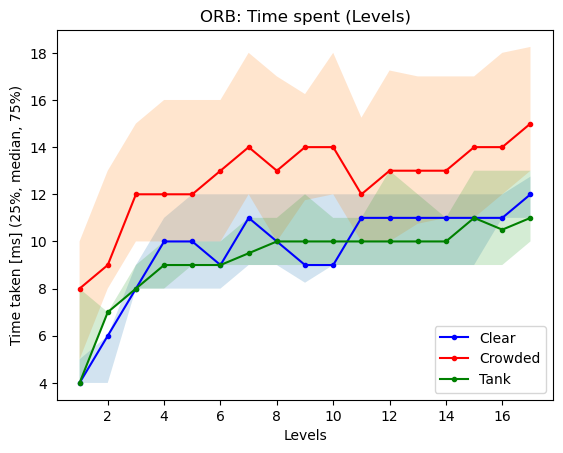

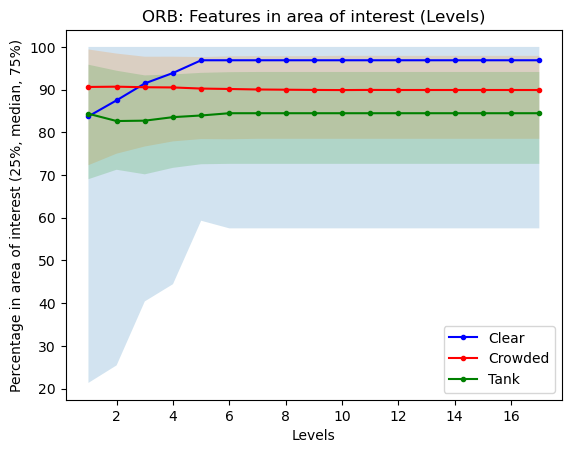

258.72815
260.83675
264.7491
267.97
271.0704
271.50225
271.38365
271.3304
271.27655
271.24585
271.2808
271.2627
271.2627
271.2627
271.2627
271.2627
271.2572
The best median performance is at levels: 6 with a percentage sum of 271.50225


In [253]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
feature_environments = [all_feature_counts_clear,all_feature_counts_crowded,all_feature_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]

feature_medians, feature_25, feature_75 = find_median_and_quartiles(feature_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of features is plotted
line_graph_median_and_quantiles(level,feature_medians,feature_25,feature_75,environments, False, 'Levels', 'Features found (25%, median, 75%)', "ORB: Features found (Levels)", True,colors,"../Data/Graphs/ORB/ORB_features_levels.png")

# Time taken is plotted
line_graph_median_and_quantiles(level,time_medians,time_25,time_75,environments, False, 'Levels', 'Time taken [ms] (25%, median, 75%)', "ORB: Time spent (Levels)", True,colors,"../Data/Graphs/ORB/ORB_time_levels.png")

# Percentage is plotted
line_graph_median_and_quantiles(level,percentage_medians,percentage_25,percentage_75,environments, False, 'Levels', 'Percentage in area of interest (25%, median, 75%)', "ORB: Features in area of interest (Levels)", True,colors,"../Data/Graphs/ORB/ORB_percentage_levels.png")

# Find layer with best median value
print_best(level,percentage_medians,"levels")

It seems that increasing the number of levels beyond 6 will have in major effect on performance. It will only decrease the number of features in the crowded environments slightly, while increasing the processing time sligthly for all environments. It would be interesting to analyse if there is a difference in the features detected between having 6 layers and 16.

Text(0.5, 1.0, 'Tank environment (16 layers)')

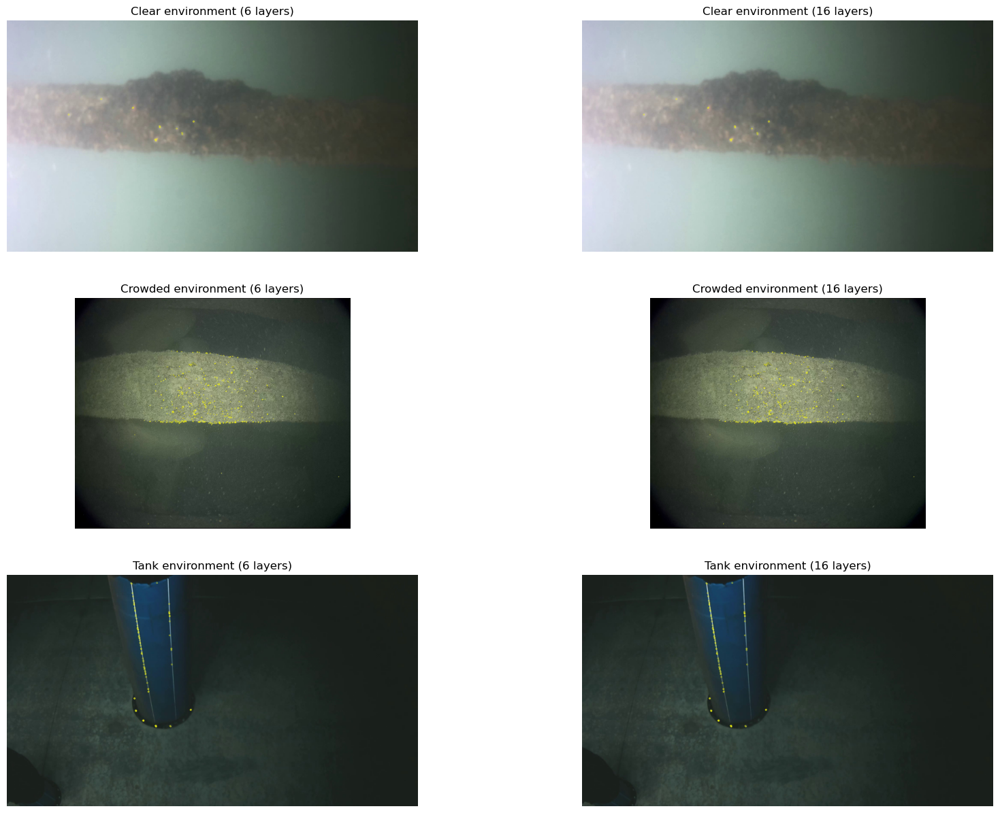

In [256]:
import cv2 
from matplotlib import pyplot as plt 

# figure 
image_figure = plt.figure(figsize=(20, 15))
rows = 3
columns = 2

# get images
clear_low = cv2.imread('../Data/Orb/Images/layers_low_frame_normal_clear_5.jpg',cv2.IMREAD_UNCHANGED)
clear_low = cv2.cvtColor(clear_low, cv2.COLOR_BGR2RGB)
clear_high = cv2.imread('../Data/Orb/Images/layers_high_frame_normal_clear_5.jpg',cv2.IMREAD_UNCHANGED) 
clear_high = cv2.cvtColor(clear_high, cv2.COLOR_BGR2RGB)

crowded_low = cv2.imread('../Data/Orb/Images/layers_low_frame_normal_crowded_23.jpg',cv2.IMREAD_UNCHANGED)
crowded_low = cv2.cvtColor(crowded_low, cv2.COLOR_BGR2RGB)
crowded_high = cv2.imread('../Data/Orb/Images/layers_high_frame_normal_crowded_23.jpg',cv2.IMREAD_UNCHANGED)
crowded_high = cv2.cvtColor(crowded_high, cv2.COLOR_BGR2RGB)

tank_low = cv2.imread('../Data/Orb/Images/layers_low_frame_normal_tank_14.jpg',cv2.IMREAD_UNCHANGED)
tank_low = cv2.cvtColor(tank_low, cv2.COLOR_BGR2RGB)
tank_high = cv2.imread('../Data/Orb/Images/layers_high_frame_normal_tank_14.jpg',cv2.IMREAD_UNCHANGED)
tank_high = cv2.cvtColor(tank_high, cv2.COLOR_BGR2RGB)

# add images to figure
image_figure.add_subplot(rows, columns, 1)
plt.imshow(clear_low) 
plt.axis('off') 
plt.title("Clear environment (6 layers)") 

image_figure.add_subplot(rows, columns, 2)
plt.imshow(clear_high) 
plt.axis('off') 
plt.title("Clear environment (16 layers)")

image_figure.add_subplot(rows, columns, 3)
plt.imshow(crowded_low) 
plt.axis('off') 
plt.title("Crowded environment (6 layers)") 

image_figure.add_subplot(rows, columns, 4)
plt.imshow(crowded_high) 
plt.axis('off') 
plt.title("Crowded environment (16 layers)")

image_figure.add_subplot(rows, columns, 5)
plt.imshow(tank_low) 
plt.axis('off') 
plt.title("Tank environment (6 layers)")

image_figure.add_subplot(rows, columns, 6)
plt.imshow(tank_high) 
plt.axis('off') 
plt.title("Tank environment (16 layers)") 

No inherent difference, between the number of layers is seen. For fututure implementations 6 layers will therefore be used.

### Start level:

The start level is as it says the level we will determine as the source image, scaling up bellow and down on top. We will analyse starting at all 6 layers in the orb detector.

The remaining variable where kept constant at the following values: <br>
Scale factor: 1.6<br>
Layers: 6<br>
Edge threshold: 34<br>
Points in element: 2<br>
Patch size: 34<br>
Fast threshold: 20<br>

In [263]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
number_of_tests = 7
start = []
current_start = 0
for i in range(number_of_tests):
    start.append(current_start)
    current_start = current_start+1
    
# Get all file paths
for i in range(number_of_tests):
    path_clear = '../Data/Orb/Clear_Dataset/start_layer_'+ str(i) +'_results.csv'
    path_crowded = '../Data/Orb/Crowded_Dataset/start_layer_'+ str(i) +'_results.csv'
    path_tank = '../Data/Orb/Tank_Dataset/start_layer_'+ str(i) +'_results.csv'
    paths_clear.append(path_clear)
    paths_crowded.append(path_crowded)
    paths_tank.append(path_tank)

# Extract desired information
all_feature_counts_clear, all_percentages_clear, all_time_counts_clear = read_segmentation_results(paths_clear,False,101)
all_feature_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_segmentation_results(paths_crowded,True,101)
all_feature_counts_tank, all_percentages_tank, all_time_counts_tank = read_segmentation_results(paths_tank,False,101)

In [264]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["Start level","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers,start)

Clear:
┏━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Start level ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃             0 ┃             122 ┃             150 ┃         81.3333333 ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃             1 ┃             120 ┃             150 ┃         80.0000000 ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃             2 ┃             111 ┃             150 ┃         74.0000000 ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃             3 ┃             102 ┃             150 ┃         68.0000000 ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃             4 ┃              89 ┃             150 ┃         59.3333333 ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃             5 ┃ 

The amount of frames, where no features are found decreases with the increase in starting level, indicating that scaling down these underwater images result in more features than scaling up.

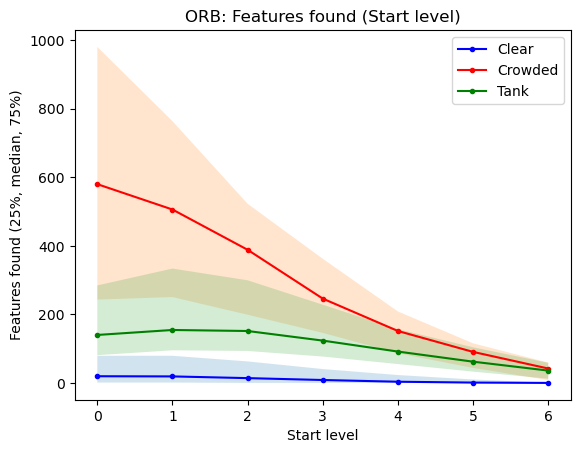

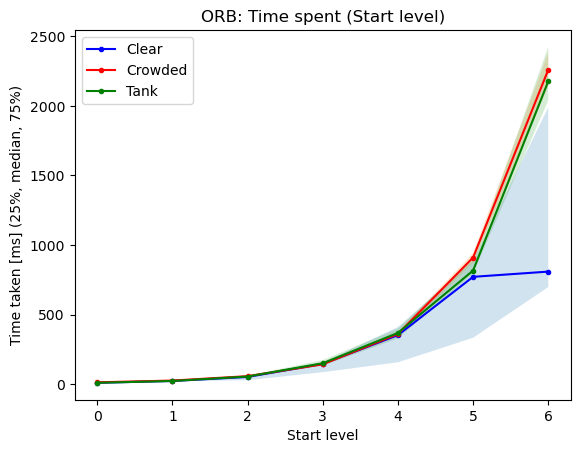

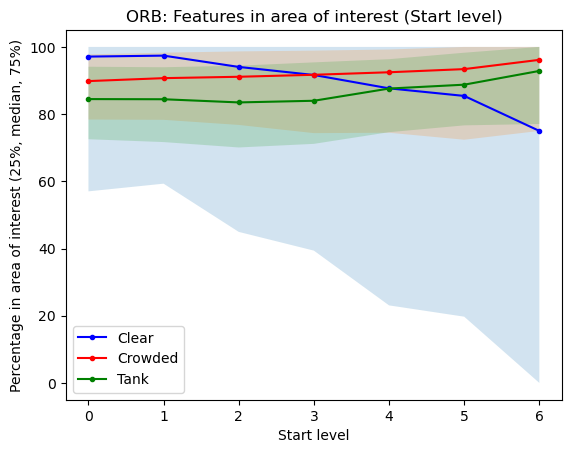

271.42725
272.54285
268.64685
267.33145
267.7388
267.57550000000003
264.0109
The best median performance is at start level: 1 with a percentage sum of 272.54285


In [266]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
feature_environments = [all_feature_counts_clear,all_feature_counts_crowded,all_feature_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]

feature_medians, feature_25, feature_75 = find_median_and_quartiles(feature_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of features is plotted
line_graph_median_and_quantiles(start,feature_medians,feature_25,feature_75,environments, False, 'Start level', 'Features found (25%, median, 75%)', "ORB: Features found (Start level)", True,colors,"../Data/Graphs/ORB/ORB_features_start_level.png")

# Time taken is plotted
line_graph_median_and_quantiles(start,time_medians,time_25,time_75,environments, False, 'Start level', 'Time taken [ms] (25%, median, 75%)', "ORB: Time spent (Start level)", True,colors,"../Data/Graphs/ORB/ORB_time_start_level.png")

# Percentage is plotted
line_graph_median_and_quantiles(start,percentage_medians,percentage_25,percentage_75,environments, False, 'Start level', 'Percentage in area of interest (25%, median, 75%)', "ORB: Features in area of interest (Start level)", True,colors,"../Data/Graphs/ORB/ORB_percentage_start_level.png")

# Find layer with best median value
print_best(start,percentage_medians,"start level")

It is frome these results clear to see that scaling down creates the only benefit. Upscaling takes way more time, making the algorithm take more than one second, meaning its unusable for "real"-time applications. It furthermore decrease the amount of features, especially for the crowded environment. It however seem to have quite little influence on the success rate compared to the other factors. There is still a decrease in all environment except for the tank environment where it seems to remove mostly "noice" features. For the best results in terms of most metrics the starting level should be 0 or 1, since both provide good results with little cost. One could argue that increasing the starting level more is valuable in order to remove alot of unnesecary features in crowded and tank environments, but at the immense cost in speed it is not worth it. <br>

Images from starting layer 0, 3 and 6 will be compared.

Text(0.5, 1.0, 'Tank environment (start level 6))')

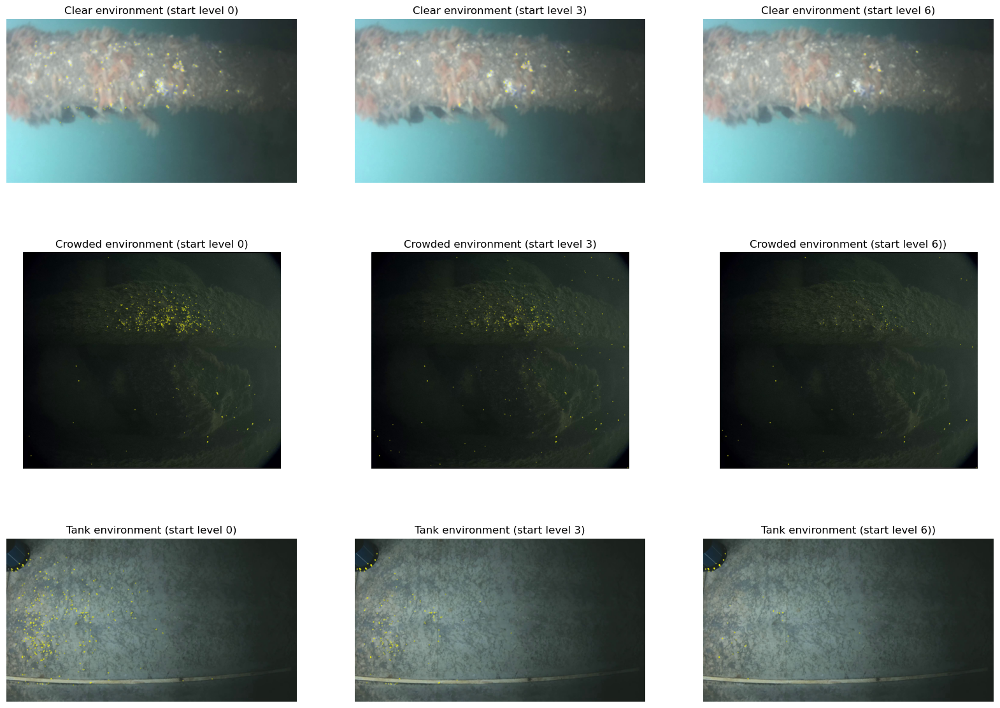

In [269]:
import cv2 
from matplotlib import pyplot as plt 

# figure 
image_figure = plt.figure(figsize=(20, 15))
rows = 3
columns = 3

# get images
clear_low = cv2.imread('../Data/Orb/Images/start_low_frame_normal_clear_41.jpg',cv2.IMREAD_UNCHANGED)
clear_low = cv2.cvtColor(clear_low, cv2.COLOR_BGR2RGB)
clear_medium = cv2.imread('../Data/Orb/Images/start_medium_frame_normal_clear_41.jpg',cv2.IMREAD_UNCHANGED)
clear_medium = cv2.cvtColor(clear_medium, cv2.COLOR_BGR2RGB)
clear_high = cv2.imread('../Data/Orb/Images/start_high_frame_normal_clear_41.jpg',cv2.IMREAD_UNCHANGED) 
clear_high = cv2.cvtColor(clear_high, cv2.COLOR_BGR2RGB)

crowded_low = cv2.imread('../Data/Orb/Images/start_low_frame_normal_crowded_4.jpg',cv2.IMREAD_UNCHANGED)
crowded_low = cv2.cvtColor(crowded_low, cv2.COLOR_BGR2RGB)
crowded_medium = cv2.imread('../Data/Orb/Images/start_medium_frame_normal_crowded_4.jpg',cv2.IMREAD_UNCHANGED)
crowded_medium = cv2.cvtColor(crowded_medium, cv2.COLOR_BGR2RGB)
crowded_high = cv2.imread('../Data/Orb/Images/start_high_frame_normal_crowded_4.jpg',cv2.IMREAD_UNCHANGED)
crowded_high = cv2.cvtColor(crowded_high, cv2.COLOR_BGR2RGB)

tank_low = cv2.imread('../Data/Orb/Images/start_low_frame_normal_tank_0.jpg',cv2.IMREAD_UNCHANGED)
tank_low = cv2.cvtColor(tank_low, cv2.COLOR_BGR2RGB)
tank_medium = cv2.imread('../Data/Orb/Images/start_medium_frame_normal_tank_0.jpg',cv2.IMREAD_UNCHANGED)
tank_medium = cv2.cvtColor(tank_medium, cv2.COLOR_BGR2RGB)
tank_high = cv2.imread('../Data/Orb/Images/start_high_frame_normal_tank_0.jpg',cv2.IMREAD_UNCHANGED)
tank_high = cv2.cvtColor(tank_high, cv2.COLOR_BGR2RGB)

# add images to figure
image_figure.add_subplot(rows, columns, 1)
plt.imshow(clear_low) 
plt.axis('off') 
plt.title("Clear environment (start level 0)")

image_figure.add_subplot(rows, columns, 2)
plt.imshow(clear_medium) 
plt.axis('off') 
plt.title("Clear environment (start level 3)") 

image_figure.add_subplot(rows, columns, 3)
plt.imshow(clear_high) 
plt.axis('off') 
plt.title("Clear environment (start level 6)")


image_figure.add_subplot(rows, columns, 4)
plt.imshow(crowded_low) 
plt.axis('off') 
plt.title("Crowded environment (start level 0)")

image_figure.add_subplot(rows, columns, 5)
plt.imshow(crowded_medium) 
plt.axis('off') 
plt.title("Crowded environment (start level 3)") 

image_figure.add_subplot(rows, columns, 6)
plt.imshow(crowded_high) 
plt.axis('off') 
plt.title("Crowded environment (start level 6))")

image_figure.add_subplot(rows, columns, 7)
plt.imshow(tank_low) 
plt.axis('off') 
plt.title("Tank environment (start level 0)")

image_figure.add_subplot(rows, columns, 8)
plt.imshow(tank_medium) 
plt.axis('off') 
plt.title("Tank environment (start level 3)")

image_figure.add_subplot(rows, columns, 9)
plt.imshow(tank_high) 
plt.axis('off') 
plt.title("Tank environment (start level 6))") 

From these images it is clear to see the removal of features that are caused by increasing the starting level. In the case of the clear environment it is seen to find less features on the pillar itself. In the crowded environments it mainly removes features on the pillar itself, and in terms of starting level 3 seems to find more "bad" features. The tank however sees that mostly "bad" features are removed, keeping the features located on the pipe. This would help clean up the dataset immensly but at a very high speed cost. Since the starting level is influenced by the environment alot and increases the speed it will be kept at the standard 0.

### Fast threshold:

The fast threshold is expected to have the biggest influence on the results, since it is the threshold used in the FAST feature detector.

The remaining variable where kept constant at the following values: <br>
Scale factor: 1.6<br>
Layers: 6<br>
Edge threshold: 34<br>
Start level: 0 <br>
Points in elements: 2 <br>
Patch size: 34<br>

In [9]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
number_of_tests = 101
fast = []
current_fast = 0
for i in range(number_of_tests):
    fast.append(current_fast)
    current_fast = current_fast+1
    
# Get all file paths
for i in range(number_of_tests):
    path_clear = '../Data/Orb/Clear_Dataset/fast_'+ str(i) +'_results.csv'
    path_crowded = '../Data/Orb/Crowded_Dataset/fast_'+ str(i) +'_results.csv'
    path_tank = '../Data/Orb/Tank_Dataset/fast_'+ str(i) +'_results.csv'
    paths_clear.append(path_clear)
    paths_crowded.append(path_crowded)
    paths_tank.append(path_tank)

# Extract desired information
all_feature_counts_clear, all_percentages_clear, all_time_counts_clear = read_segmentation_results(paths_clear,False,101)
all_feature_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_segmentation_results(paths_crowded,True,101)
all_feature_counts_tank, all_percentages_tank, all_time_counts_tank = read_segmentation_results(paths_tank,False,101)

In [12]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
environments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["Fast threshold","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data,headers,fast)

Clear:
┏━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Fast threshold ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                0 ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                8 ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃                9 ┃             148 ┃             150 ┃         98.6666667 ┃
┣━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃               10 ┃             147 ┃             150 ┃         98.0000000 ┃
┣━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃               11 ┃             146 ┃             150 ┃         97.3333333 ┃
┣━━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━

Higher thresholds -> fewer features -> more invalid samples. The clear dataset already hits half validity at 36.

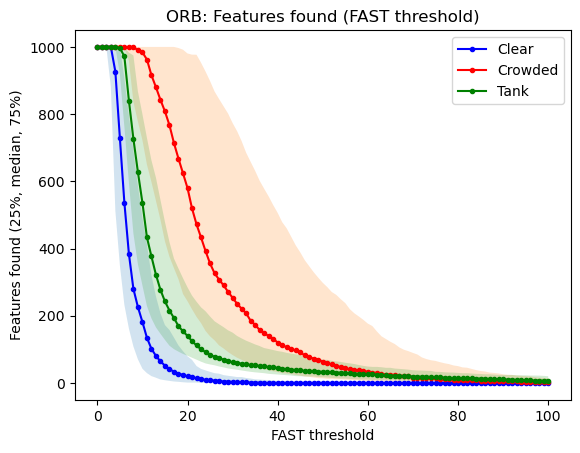

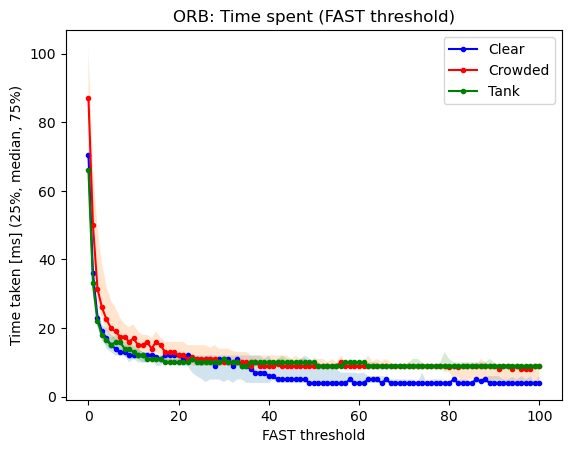

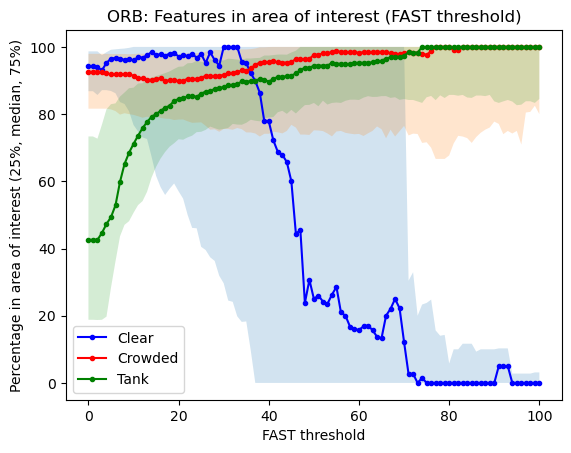

229.4
229.4
229.15
230.31900000000002
234.71200000000002
237.6526
241.42405
248.19875000000002
253.20015
256.80205
258.55885
261.15455
263.35495000000003
265.34155
267.89135
268.15495
269.48075
269.01675
270.67015000000004
272.3334
271.42725
272.1962
273.0721
273.8254
272.40970000000004
274.84535
273.31870000000004
276.57185
274.80155
273.7146
279.7001
280.70444999999995
280.94615
281.33910000000003
278.38305
277.51874999999995
275.73345
274.4423
272.18190000000004
263.5759
262.98665
258.31055
255.32819999999998
254.32125000000002
252.39745
246.9188
232.99755000000002
234.9865
213.933
220.9074
217.06040000000002
218.12095
216.7267
216.0901
219.97755
222.26704999999998
214.5391
213.31240000000003
210.2422
209.52585
209.4184
210.43885
210.80415
209.6333
208.013735
207.69169999999997
214.9644
217.07775
220.09019999999998
217.14159999999998
207.7918
199.26475499999998
199.184105
196.46215
199.53455000000002
197.67034999999998
198.7013
200.0
200.0
200.0
200.0
199.01315
199.13795
200.0
200.0

In [279]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
feature_environments = [all_feature_counts_clear,all_feature_counts_crowded,all_feature_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]

feature_medians, feature_25, feature_75 = find_median_and_quartiles(feature_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of features is plotted
line_graph_median_and_quantiles(fast,feature_medians,feature_25,feature_75,environments, False, 'FAST threshold', 'Features found (25%, median, 75%)', "ORB: Features found (FAST threshold)", True,colors,"../Data/Graphs/ORB/ORB_features_fast_threshold.png")

# Time taken is plotted
line_graph_median_and_quantiles(fast,time_medians,time_25,time_75,environments, False, 'FAST threshold', 'Time taken [ms] (25%, median, 75%)', "ORB: Time spent (FAST threshold)", True,colors,"../Data/Graphs/ORB/ORB_time_fast_threshold.png")

# Percentage is plotted
line_graph_median_and_quantiles(fast,percentage_medians,percentage_25,percentage_75,environments, False, 'FAST threshold', 'Percentage in area of interest (25%, median, 75%)', "ORB: Features in area of interest (FAST threshold)", True,colors,"../Data/Graphs/ORB/ORB_percentage_fast_threshold.png")

# Find layer with best median value
print_best(fast,percentage_medians,"FAST threshold")

As espected the FAST threshold has a very big influence on the results. Low values result in a ton of features in both the clear and tank environments at levels never seen before. This however comes at a slight cost in time and for the tank environment also in desired performance. The tank and clear environment acts differently in terms of performance. The clear envionment falls quickly with the increase in FAST threshold due to almost no features being present and they few that are being "noise". On the other hand the tank environment sees the noise features disapear leaving only those on the pipes. The crowded environment also drops in performance, but only slightly. This is most likely due to many features on pillars disapering compared to those on adjacent rocks.  The result with the best performance is 32, but this leaves very few features in the clear environment. Lowering it will give more features in the clear environment, but worsen the performance of the tank environment. However due to the pipes in the tank environment showing clear lines, it might be easy to remove the additional error features. <br>

I will analyse image at 10, 32, and 50 to determine what the best choice is.

Text(0.5, 1.0, 'Tank environment (FAST threshold 50)')

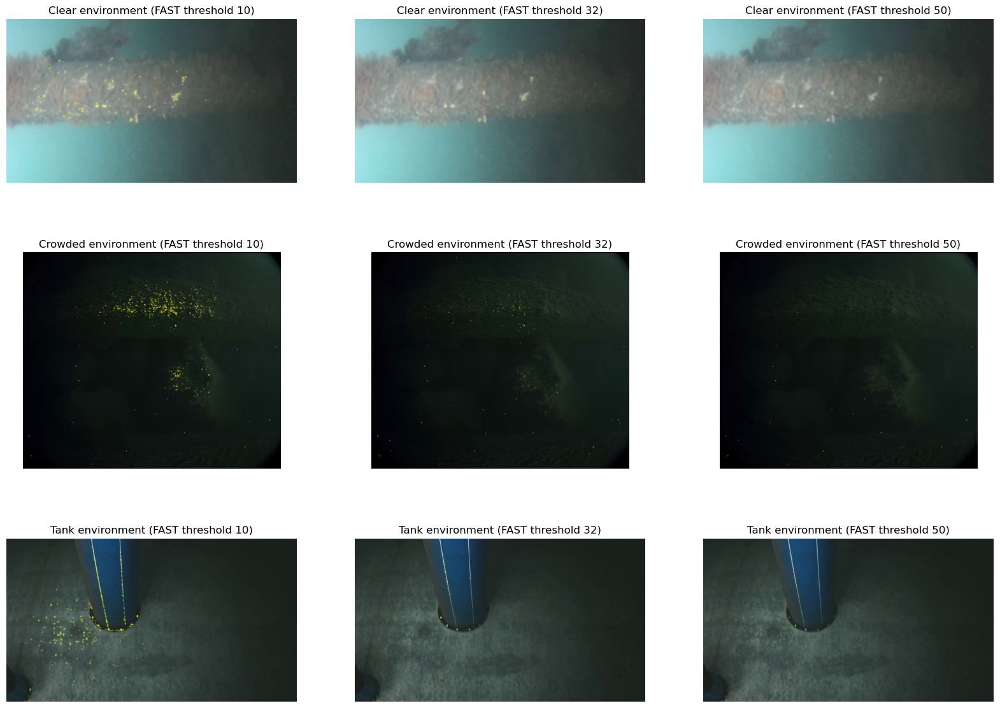

In [284]:
import cv2 
from matplotlib import pyplot as plt 

# figure 
image_figure = plt.figure(figsize=(20, 15))
rows = 3
columns = 3

# get images
clear_low = cv2.imread('../Data/Orb/Images/fast_low_frame_normal_clear_43.jpg',cv2.IMREAD_UNCHANGED)
clear_low = cv2.cvtColor(clear_low, cv2.COLOR_BGR2RGB)
clear_medium = cv2.imread('../Data/Orb/Images/fast_medium_frame_normal_clear_43.jpg',cv2.IMREAD_UNCHANGED)
clear_medium = cv2.cvtColor(clear_medium, cv2.COLOR_BGR2RGB)
clear_high = cv2.imread('../Data/Orb/Images/fast_high_frame_normal_clear_43.jpg',cv2.IMREAD_UNCHANGED) 
clear_high = cv2.cvtColor(clear_high, cv2.COLOR_BGR2RGB)

crowded_low = cv2.imread('../Data/Orb/Images/fast_low_frame_normal_crowded_5.jpg',cv2.IMREAD_UNCHANGED)
crowded_low = cv2.cvtColor(crowded_low, cv2.COLOR_BGR2RGB)
crowded_medium = cv2.imread('../Data/Orb/Images/fast_medium_frame_normal_crowded_5.jpg',cv2.IMREAD_UNCHANGED)
crowded_medium = cv2.cvtColor(crowded_medium, cv2.COLOR_BGR2RGB)
crowded_high = cv2.imread('../Data/Orb/Images/fast_high_frame_normal_crowded_5.jpg',cv2.IMREAD_UNCHANGED)
crowded_high = cv2.cvtColor(crowded_high, cv2.COLOR_BGR2RGB)

tank_low = cv2.imread('../Data/Orb/Images/fast_low_frame_normal_tank_10.jpg',cv2.IMREAD_UNCHANGED)
tank_low = cv2.cvtColor(tank_low, cv2.COLOR_BGR2RGB)
tank_medium = cv2.imread('../Data/Orb/Images/fast_medium_frame_normal_tank_10.jpg',cv2.IMREAD_UNCHANGED)
tank_medium = cv2.cvtColor(tank_medium, cv2.COLOR_BGR2RGB)
tank_high = cv2.imread('../Data/Orb/Images/fast_high_frame_normal_tank_10.jpg',cv2.IMREAD_UNCHANGED)
tank_high = cv2.cvtColor(tank_high, cv2.COLOR_BGR2RGB)

# add images to figure
image_figure.add_subplot(rows, columns, 1)
plt.imshow(clear_low) 
plt.axis('off') 
plt.title("Clear environment (FAST threshold 10)")

image_figure.add_subplot(rows, columns, 2)
plt.imshow(clear_medium) 
plt.axis('off') 
plt.title("Clear environment (FAST threshold 32)") 

image_figure.add_subplot(rows, columns, 3)
plt.imshow(clear_high) 
plt.axis('off') 
plt.title("Clear environment (FAST threshold 50)")


image_figure.add_subplot(rows, columns, 4)
plt.imshow(crowded_low) 
plt.axis('off') 
plt.title("Crowded environment (FAST threshold 10)")

image_figure.add_subplot(rows, columns, 5)
plt.imshow(crowded_medium) 
plt.axis('off') 
plt.title("Crowded environment (FAST threshold 32)") 

image_figure.add_subplot(rows, columns, 6)
plt.imshow(crowded_high) 
plt.axis('off') 
plt.title("Crowded environment (FAST threshold 50)")

image_figure.add_subplot(rows, columns, 7)
plt.imshow(tank_low) 
plt.axis('off') 
plt.title("Tank environment (FAST threshold 10)")

image_figure.add_subplot(rows, columns, 8)
plt.imshow(tank_medium) 
plt.axis('off') 
plt.title("Tank environment (FAST threshold 32)")

image_figure.add_subplot(rows, columns, 9)
plt.imshow(tank_high) 
plt.axis('off') 
plt.title("Tank environment (FAST threshold 50)") 

Here it is seen that the clear environment have the posibility for way more features and only little error features at low FAST thresholds. The Croweded environment might also have more errors, but at high thresholds only error features remain, especially in darker areas. The tank environment removes all the error features from the concrete backdrop but also leaves very little for future detection, even though all features are on the pillars. Im inclined to go with 13, since this results in more than 95% of the clear environment frames being valid, keeping enough features to work with in clear environment, while still avoiding too many noise in the tank environment.

## ORB matching

### Path and edge size

In [316]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
max_environment_tests = 4
patch_sizes = []
for i in range(10,51):
    patch_sizes.append(i)
    

# Get all file paths
path_clear = '../Data/Orb/matching/patch_matching_clear.csv'
path_tank = '../Data/Orb/matching/patch_matching_tank.csv'
path_crowded = '../Data/Orb/matching/patch_matching_crowded.csv'
paths_crowded.append(path_crowded)
paths_clear.append(path_clear)
paths_tank.append(path_tank)
    
# Extract desired information
all_match_counts_clear, all_percentages_clear, all_time_counts_clear = read_matching_results(paths_clear)
all_match_counts_tank, all_percentages_tank, all_time_counts_tank = read_matching_results(paths_tank)
all_match_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_matching_results(paths_crowded)

In [318]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["Patch size","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data, headers, patch_sizes)

Clear:
┏━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Patch size ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃           10 ┃              99 ┃              99 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃           37 ┃              99 ┃              99 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃           38 ┃             198 ┃             199 ┃         99.4974874 ┃
┣━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃           39 ┃              99 ┃              99 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃           44 ┃              99 ┃              99 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃           45 ┃              9

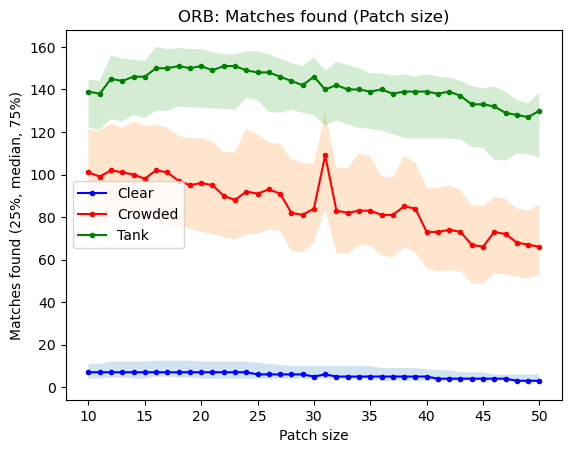

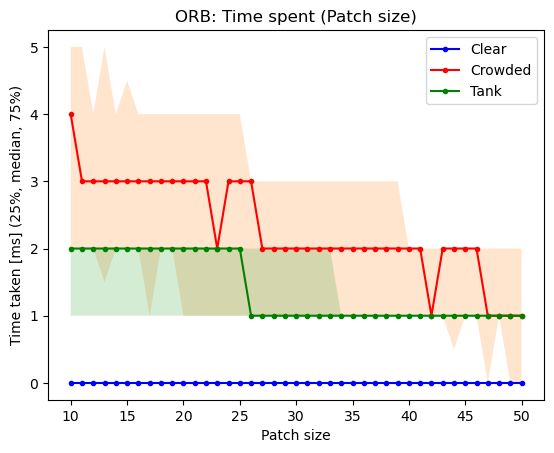

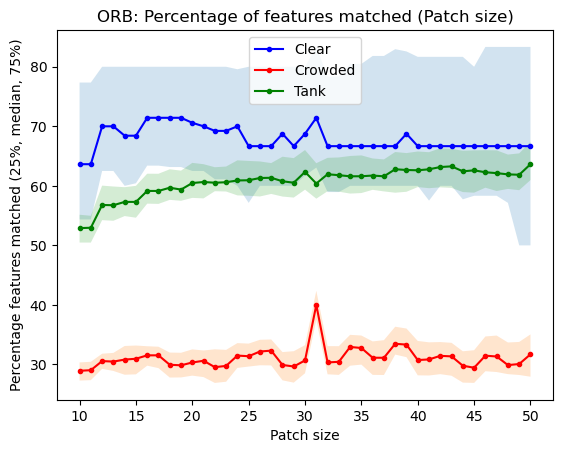

145.4736
145.63830000000002
157.3534
157.2303
156.5421
156.6854
162.10410000000002
162.1067
161.0616
160.6628
161.3943
161.2646
159.3026
159.5956
162.397
158.9872
160.1575
160.3445
159.4361
156.8508
161.7704
171.82080000000002
158.95420000000001
158.9022
161.2113
161.0426
159.5272
159.3891
162.93200000000002
164.7442
160.0186
160.2945
161.2711
161.29989999999998
158.8929
158.7238
160.4228
160.1406
158.4865
158.6024
162.0104
The best median performance is at Patch size: 31 with a percentage sum of 171.82080000000002


In [320]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
match_environments = [all_match_counts_clear,all_match_counts_crowded,all_match_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]


match_medians, match_25, match_75 = find_median_and_quartiles(match_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of matches is plotted
line_graph_median_and_quantiles(patch_sizes,match_medians,match_25,match_75,environments, False, 'Patch size', 'Matches found (25%, median, 75%)', "ORB: Matches found (Patch size)", True,colors,"../Data/Graphs/ORB/ORB_matches_patch_size.png")

# Time taken is plotted
line_graph_median_and_quantiles(patch_sizes,time_medians,time_25,time_75,environments, False, 'Patch size', 'Time taken [ms] (25%, median, 75%)', "ORB: Time spent (Patch size)", True,colors,"../Data/Graphs/ORB/ORB_match_time_patch_size.png")

# Percentage is plotted
line_graph_median_and_quantiles(patch_sizes,percentage_medians,percentage_25,percentage_75,environments, False, 'Patch size', 'Percentage features matched (25%, median, 75%)', "ORB: Percentage of features matched (Patch size)", True,colors,"../Data/Graphs/ORB/ORB_match_percentage_patch_size.png")

# Find layer with best median value
print_best(patch_sizes,percentage_medians,"Patch size")

### BRIEF points

In [443]:
import csv

# Paths
paths_clear = []
paths_crowded = []
paths_tank = []

# Other variables
max_environment_tests = 4
brief_points = [2,3,4]
    
# Get all file paths
path_clear = '../Data/Orb/matching/brief_points_matching_clear.csv'
path_tank = '../Data/Orb/matching/brief_points_matching_tank.csv'
path_crowded = '../Data/Orb/matching/brief_points_matching_crowded.csv'
paths_crowded.append(path_crowded)
paths_clear.append(path_clear)
paths_tank.append(path_tank)
    
# Extract desired information
all_match_counts_clear, all_percentages_clear, all_time_counts_clear = read_matching_results(paths_clear)
all_match_counts_tank, all_percentages_tank, all_time_counts_tank = read_matching_results(paths_tank)
all_match_counts_crowded, all_percentages_crowded, all_time_counts_crowded = read_matching_results(paths_crowded)

In [445]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clear_clean,clear_count = remove_invalid(all_percentages_clear)
all_percentages_crowded_clean,crowded_count = remove_invalid(all_percentages_crowded)
all_percentages_tank_clean,tank_count = remove_invalid(all_percentages_tank)

# Create headers
enviroments = ["Clear", "Crowded", "Tank"]
valid_count_environments = [clear_count, crowded_count, tank_count]
all_data = [all_percentages_clear,all_percentages_crowded,all_percentages_tank]
headers = ["Brief points","valid samples", "total samples", "percentage valid"]

show_validity_table(environments,valid_count_environments, all_data, headers, brief_points)

Clear:
┏━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Brief points ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃              2 ┃              99 ┃              99 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃              4 ┃              99 ┃              99 ┃        100.0000000 ┃
┗━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━━━━┛
Crowded:
┏━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃   Brief points ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃              2 ┃              99 ┃              99 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃              4 ┃              99 ┃              99 ┃        100.000000

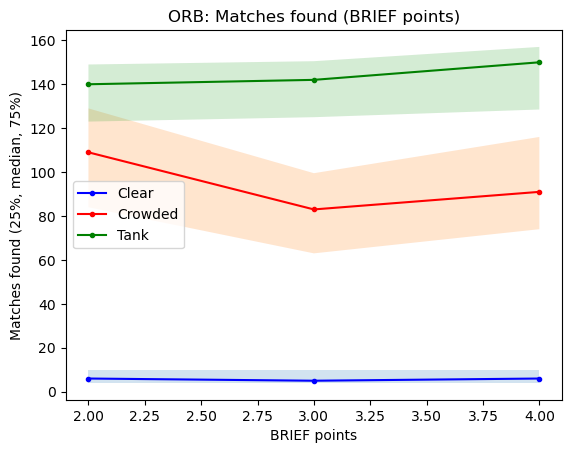

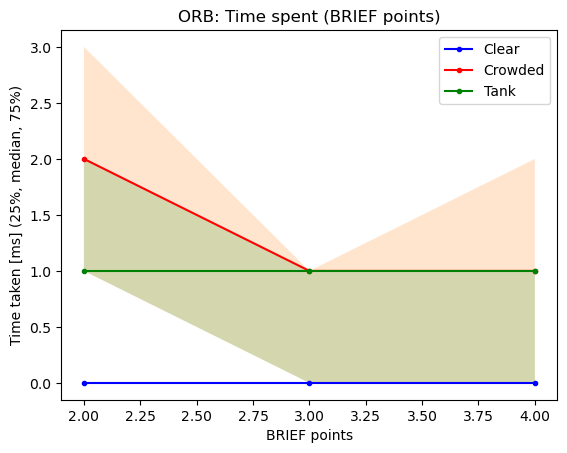

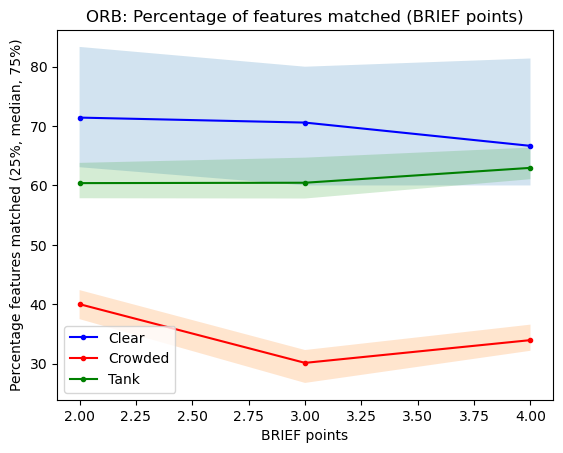

171.82080000000002
161.15630000000002
163.5747
The best median performance is at BRIEF points: 2 with a percentage sum of 171.82080000000002


In [447]:
import matplotlib.pyplot as plt
import numpy as np
import statistics 

# Find medians and quantiles
match_environments = [all_match_counts_clear,all_match_counts_crowded,all_match_counts_tank]
time_environments = [all_time_counts_clear,all_time_counts_crowded,all_time_counts_tank]
percentage_environments = [all_percentages_clear_clean,all_percentages_crowded_clean,all_percentages_tank_clean]


match_medians, match_25, match_75 = find_median_and_quartiles(match_environments)
time_medians, time_25, time_75 = find_median_and_quartiles(time_environments)
percentage_medians, percentage_25, percentage_75 = find_median_and_quartiles(percentage_environments)

# Data structure: category -> environment -> setting
environments = ["Clear", "Crowded", "Tank"]
colors = ['b','r','g']

# Number of matches is plotted
line_graph_median_and_quantiles(brief_points,match_medians,match_25,match_75,environments, False, 'BRIEF points', 'Matches found (25%, median, 75%)', "ORB: Matches found (BRIEF points)", True,colors,"../Data/Graphs/ORB/ORB_matches_brief_points.png")

# Time taken is plotted
line_graph_median_and_quantiles(brief_points,time_medians,time_25,time_75,environments, False, 'BRIEF points', 'Time taken [ms] (25%, median, 75%)', "ORB: Time spent (BRIEF points)", True,colors,"../Data/Graphs/ORB/ORB_match_time_brief_points.png")

# Percentage is plotted
line_graph_median_and_quantiles(brief_points,percentage_medians,percentage_25,percentage_75,environments, False, 'BRIEF points', 'Percentage features matched (25%, median, 75%)', "ORB: Percentage of features matched (BRIEF points)", True,colors,"../Data/Graphs/ORB/ORB_match_percentage_brief_points .png")

# Find layer with best median value
print_best(brief_points,percentage_medians,"BRIEF points")

## Comparing best results:

The feature detectors will now be compared in terms of their performance with the best deemed parameter settings. The final settings are:<br>

SIFT: <br>
Layers: 3 <br>
Contrast threshold: 0.03 <br>
Edge threshold: 43 <br>
Sigma: 1.6 <br>
With precise upscaling disabled.<br>

ORB: <br>
Scale factor: 1.6<br>
Layers: 6<br>
Edge threshold: 31<br>
Start level: 0 <br>
Points in elements: 2 <br>
Patch size: 31<br>
FAST threshold: 13 <br>

AKAZE: <br>
Descriptor type: MLDB <br>
Descriptor size: Full size <br>
Descriptor channels: 3 <br>
Response threshol: 0.0001 <br>
Diffusivity type: PM G2 <br>
Max octaves: 2 <br>
Octave sublevels: 2 <br>

In [544]:
import csv

number_of_tests = 3

# Paths
orb_paths_clear = ['../Data/Orb/best_annotation/best_clear1.csv','../Data/Orb/best_annotation/best_clear2.csv','../Data/Orb/best_annotation/best_clear3.csv']
orb_paths_tank = ['../Data/Orb/best_annotation/best_tank1.csv','../Data/Orb/best_annotation/best_tank2.csv','../Data/Orb/best_annotation/best_tank3.csv']
orb_paths_crowded = ['../Data/Orb/best_annotation/best_crowded1.csv','../Data/Orb/best_annotation/best_crowded2.csv']

akaze_paths_clear = ['../Data/Akaze/best_annotation/best_clear1.csv','../Data/Akaze/best_annotation/best_clear2.csv','../Data/Akaze/best_annotation/best_clear3.csv']
akaze_paths_tank = ['../Data/Akaze/best_annotation/best_tank1.csv','../Data/Akaze/best_annotation/best_tank2.csv','../Data/Akaze/best_annotation/best_tank3.csv']
akaze_paths_crowded = ['../Data/Akaze/best_annotation/best_crowded1.csv','../Data/Akaze/best_annotation/best_crowded2.csv']

sift_paths_clear = ['../Data/Sift/best_annotation/best_clear1.csv','../Data/Sift/best_annotation/best_clear2.csv','../Data/Sift/best_annotation/best_clear3.csv']
sift_paths_tank = ['../Data/Sift/best_annotation/best_tank1.csv','../Data/Sift/best_annotation/best_tank2.csv','../Data/Sift/best_annotation/best_tank3.csv']
sift_paths_crowded = ['../Data/Sift/best_annotation/best_crowded1.csv','../Data/Sift/best_annotation/best_crowded2.csv']


# Extract desired information
all_feature_counts_clear_orb, all_percentages_clear_orb, all_time_counts_clear_orb = read_annotation_results(orb_paths_clear)
all_feature_counts_tank_orb, all_percentages_tank_orb, all_time_counts_tank_orb = read_annotation_results(orb_paths_tank)
all_feature_counts_crowded_orb, all_percentages_crowded_orb, all_time_counts_crowded_orb = read_annotation_results(orb_paths_crowded)

all_feature_counts_clear_akaze, all_percentages_clear_akaze, all_time_counts_clear_akaze = read_annotation_results(akaze_paths_clear)
all_feature_counts_tank_akaze, all_percentages_tank_akaze, all_time_counts_tank_akaze = read_annotation_results(akaze_paths_tank)
all_feature_counts_crowded_akaze, all_percentages_crowded_akaze, all_time_counts_crowded_akaze = read_annotation_results(akaze_paths_crowded)

all_feature_counts_clear_sift, all_percentages_clear_sift, all_time_counts_clear_sift = read_annotation_results(sift_paths_clear)
all_feature_counts_tank_sift, all_percentages_tank_sift, all_time_counts_tank_sift = read_annotation_results(sift_paths_tank)
all_feature_counts_crowded_sift, all_percentages_crowded_sift, all_time_counts_crowded_sift = read_annotation_results(sift_paths_crowded)



all_feature_counts_orb = [all_feature_counts_clear_orb[0],all_feature_counts_crowded_orb[0],all_feature_counts_tank_orb[0]]
all_feature_counts_akaze = [all_feature_counts_clear_akaze[0],all_feature_counts_crowded_akaze[0],all_feature_counts_tank_akaze[0]]
all_feature_counts_sift = [all_feature_counts_clear_sift[0],all_feature_counts_crowded_sift[0],all_feature_counts_tank_sift[0]]


all_percentages_orb = [all_percentages_clear_orb[0],all_percentages_crowded_orb[0],all_percentages_tank_orb[0]]
all_percentages_akaze = [all_percentages_clear_akaze[0],all_percentages_crowded_akaze[0],all_percentages_tank_akaze[0]]
all_percentages_sift = [all_percentages_clear_sift[0],all_percentages_crowded_sift[0],all_percentages_tank_sift[0]]


all_time_counts_orb = [all_time_counts_clear_orb[0],all_time_counts_crowded_orb[0],all_time_counts_tank_orb[0]]
all_time_counts_akaze = [all_time_counts_clear_akaze[0],all_time_counts_crowded_akaze[0],all_time_counts_tank_akaze[0]]
all_time_counts_sift = [all_time_counts_clear_sift[0],all_time_counts_crowded_sift[0],all_time_counts_tank_sift[0]]


In [546]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clean_orb,count_orb = remove_invalid(all_percentages_orb)
all_percentages_clean_akaze,count_akaze = remove_invalid(all_percentages_akaze)
all_percentages_clean_sift,count_sift = remove_invalid(all_percentages_sift)

# Create headers
enviroments =  ["Clear","Crowded","Tank"]
methods = ["ORB", "AKAZE","SIFT"]
valid_count_environments = [count_orb, count_akaze, count_sift]
all_data = [all_percentages_orb, all_percentages_akaze, all_percentages_sift]
headers = ["Environment","valid samples", "total samples", "percentage valid"]

show_validity_table(methods,valid_count_environments, all_data,headers,enviroments)

ORB:
┏━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃ Environment   ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ Clear         ┃             144 ┃             150 ┃         96.0000000 ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ Crowded       ┃             100 ┃             100 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ Tank          ┃             150 ┃             150 ┃        100.0000000 ┃
┗━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━━━━┛
AKAZE:
┏━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃ Environment   ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ Clear         ┃             150 ┃             150 ┃        100.0000000 ┃
┣━━━━━━━━━━━━

ORB performs slightly better in terms of valid samples in clear environments.

3
3
3
3


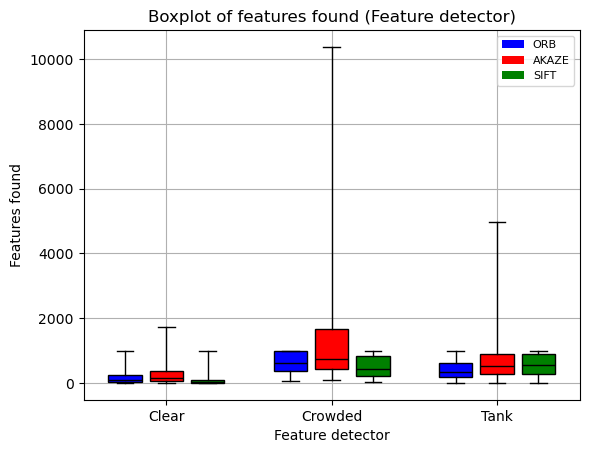

3
3
3
3


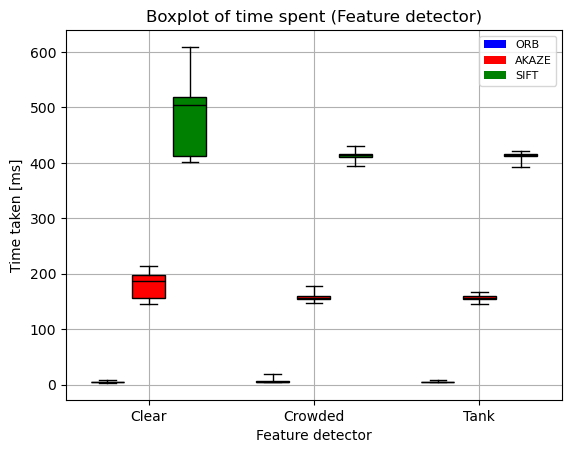

3
3
3
3


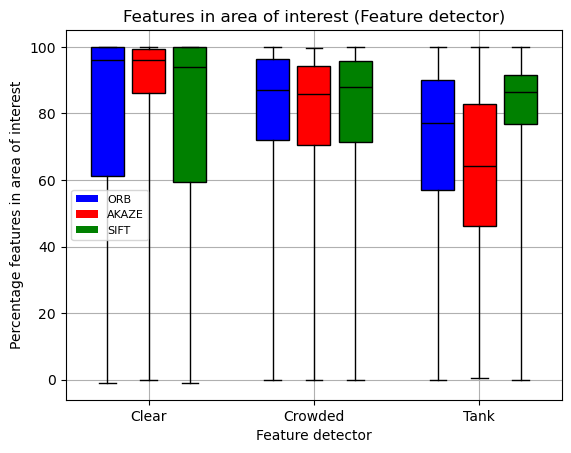

In [549]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import numpy as np
import statistics
import seaborn as sns
import pandas as pd

# clean percentage (-1 -> 0)
#all_percentages_orb = pad_invalid(all_percentages_orb)
#all_percentages_akaze = pad_invalid(all_percentages_akaze)

# Find medians and quantiles
feature_methods = [all_feature_counts_orb,all_feature_counts_akaze,all_feature_counts_sift]
time_methods = [all_time_counts_orb,all_time_counts_akaze,all_time_counts_sift]
percentage_methods = [all_percentages_orb,all_percentages_akaze,all_percentages_sift]

# Show boxplots
labels = ["ORB", "AKAZE","SIFT"]
colors = ['b','r','g']

show_double_grouped_boxplots(labels,environments, feature_methods, colors, 'Feature detector', 'Features found','Boxplot of features found (Feature detector)',True,"../Data/Graphs/COMPARE/COMPARE_box_match.png")
show_double_grouped_boxplots(labels,environments, time_methods, colors, 'Feature detector', 'Time taken [ms]','Boxplot of time spent (Feature detector)',True,"../Data/Graphs/COMPARE/COMPARE_box_match_time.png")
show_double_grouped_boxplots(labels,environments, percentage_methods, colors, 'Feature detector', 'Percentage features in area of interest','Features in area of interest (Feature detector)',True,"../Data/Graphs/COMPARE/COMPARE_box_match_percentage.png")

In terms of time ORB is the clear winner in all regards. When it comes to features both perform well for crowded environments, but with SIFT seemingly having more variance. For the tank environment ORB performs worse, but ORB finds more features in the clear environment even though it seemingly have a bit more variance there. In terms of feature quality (amount of features in areas of interest) ORB slightly outperforms SIFT in clear and crowded environments, but not with anything significant. In terms of the tank environment SIFT performs quite alot better and with way less variance. Since it however might be possible to easily filter the tank features, ORB is chosen as the best feature detector for the purpose. It is however also interesting to look at matches between frames.

### Matching test

In [553]:
import csv

number_of_tests = 3

# Paths
orb_paths_clear = ['../Data/Orb/best_matching/best_clear.csv']
orb_paths_tank = ['../Data/Orb/best_matching/best_tank.csv']
orb_paths_crowded = ['../Data/Orb/best_matching/best_crowded.csv']

akaze_paths_clear = ['../Data/Akaze/best_matching/best_clear.csv']
akaze_paths_tank = ['../Data/Akaze/best_matching/best_tank.csv']
akaze_paths_crowded = ['../Data/Akaze/best_matching/best_crowded.csv']

sift_paths_clear = ['../Data/Sift/best_matching/best_clear.csv']
sift_paths_tank = ['../Data/Sift/best_matching/best_tank.csv']
sift_paths_crowded = ['../Data/Sift/best_matching/best_crowded.csv']


# Extract desired information
all_match_counts_clear_orb, all_percentages_clear_orb, all_time_counts_clear_orb = read_matching_results(orb_paths_clear)
all_match_counts_tank_orb, all_percentages_tank_orb, all_time_counts_tank_orb = read_matching_results(orb_paths_tank)
all_match_counts_crowded_orb, all_percentages_crowded_orb, all_time_counts_crowded_orb = read_matching_results(orb_paths_crowded)

all_match_counts_clear_akaze, all_percentages_clear_akaze, all_time_counts_clear_akaze = read_matching_results(akaze_paths_clear)
all_match_counts_tank_akaze, all_percentages_tank_akaze, all_time_counts_tank_akaze = read_matching_results(akaze_paths_tank)
all_match_counts_crowded_akaze, all_percentages_crowded_akaze, all_time_counts_crowded_akaze = read_matching_results(akaze_paths_crowded)

all_match_counts_clear_sift, all_percentages_clear_sift, all_time_counts_clear_sift = read_matching_results(sift_paths_clear)
all_match_counts_tank_sift, all_percentages_tank_sift, all_time_counts_tank_sift = read_matching_results(sift_paths_tank)
all_match_counts_crowded_sift, all_percentages_crowded_sift, all_time_counts_crowded_sift = read_matching_results(sift_paths_crowded)



all_match_counts_orb = [all_match_counts_clear_orb[0],all_match_counts_crowded_orb[0],all_match_counts_tank_orb[0]]
all_match_counts_akaze = [all_match_counts_clear_akaze[0],all_match_counts_crowded_akaze[0],all_match_counts_tank_akaze[0]]
all_match_counts_sift = [all_match_counts_clear_sift[0],all_match_counts_crowded_sift[0],all_match_counts_tank_sift[0]]


all_percentages_orb = [all_percentages_clear_orb[0],all_percentages_crowded_orb[0],all_percentages_tank_orb[0]]
all_percentages_akaze = [all_percentages_clear_akaze[0],all_percentages_crowded_akaze[0],all_percentages_tank_akaze[0]]
all_percentages_sift = [all_percentages_clear_sift[0],all_percentages_crowded_sift[0],all_percentages_tank_sift[0]]


all_time_counts_orb = [all_time_counts_clear_orb[0],all_time_counts_crowded_orb[0],all_time_counts_tank_orb[0]]
all_time_counts_akaze = [all_time_counts_clear_akaze[0],all_time_counts_crowded_akaze[0],all_time_counts_tank_akaze[0]]
all_time_counts_sift = [all_time_counts_clear_sift[0],all_time_counts_crowded_sift[0],all_time_counts_tank_sift[0]]


In [555]:
from tabulate import tabulate, SEPARATING_LINE

# remove -1 elements as it is the representation of N/A and count valid samples
all_percentages_clean_orb,count_orb = remove_invalid(all_percentages_orb)
all_percentages_clean_akaze,count_akaze = remove_invalid(all_percentages_akaze)
all_percentages_clean_sift,count_sift = remove_invalid(all_percentages_sift)

# Create headers
enviroments =  ["Clear","Crowded","Tank"]
methods = ["ORB", "AKAZE","SIFT"]
valid_count_environments = [count_orb, count_akaze, count_sift]
all_data = [all_percentages_orb, all_percentages_akaze, all_percentages_sift]
headers = ["Environment","valid samples", "total samples", "percentage valid"]

show_validity_table(methods,valid_count_environments, all_data,headers,enviroments)

ORB:
┏━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃ Environment   ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ Clear         ┃              99 ┃              99 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ Tank          ┃              99 ┃              99 ┃        100.0000000 ┃
┗━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━┻━━━━━━━━━━━━━━━━━━━━┛
AKAZE:
┏━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃ Environment   ┃   valid samples ┃   total samples ┃   percentage valid ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ Clear         ┃              99 ┃              99 ┃        100.0000000 ┃
┣━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━╋━━━━━━━━━━━━━━━━━━━━┫
┃ Tank          ┃              99 ┃              99 ┃        100.0000000 ┃
┗━━━━━━━━━━━━

3
3
3
3


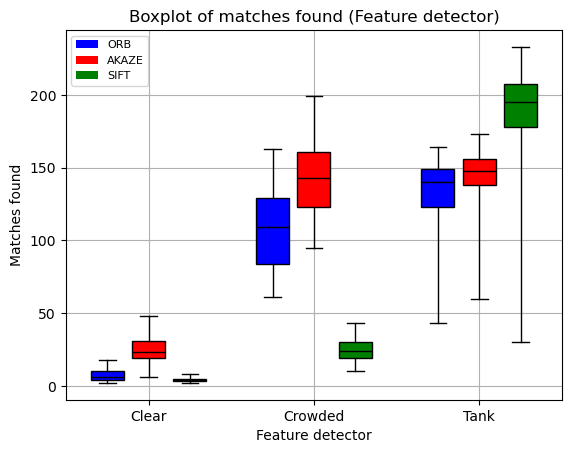

3
3
3
3


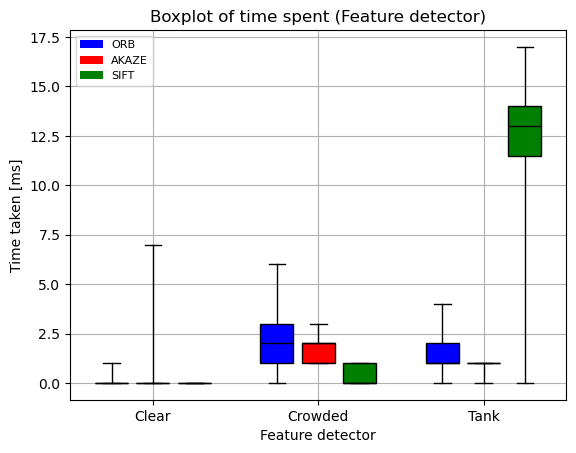

3
3
3
3


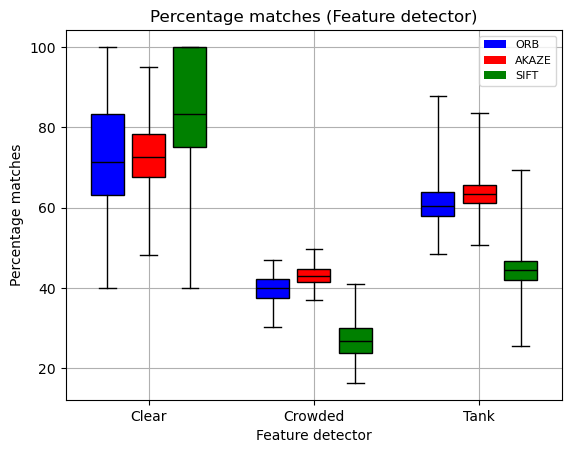

In [557]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import numpy as np
import statistics
import seaborn as sns
import pandas as pd

# clean percentage (-1 -> 0)
#all_percentages_orb = pad_invalid(all_percentages_orb)
#all_percentages_akaze = pad_invalid(all_percentages_akaze)

# Find medians and quantiles
match_methods = [all_match_counts_orb,all_match_counts_akaze,all_match_counts_sift]
time_methods = [all_time_counts_orb,all_time_counts_akaze,all_time_counts_sift]
percentage_methods = [all_percentages_orb,all_percentages_akaze,all_percentages_sift]

# Show boxplots
labels = ["ORB", "AKAZE","SIFT"]
colors = ['b','r','g']

show_double_grouped_boxplots(labels,environments, match_methods, colors, 'Feature detector', 'Matches found','Boxplot of matches found (Feature detector)',True,"../Data/Graphs/COMPARE/COMPARE_box_features.png")
show_double_grouped_boxplots(labels,environments, time_methods, colors, 'Feature detector', 'Time taken [ms]','Boxplot of time spent (Feature detector)',True,"../Data/Graphs/COMPARE/COMPARE_box_time.png")
show_double_grouped_boxplots(labels,environments, percentage_methods, colors, 'Feature detector', 'Percentage matches','Percentage matches (Feature detector)',True,"../Data/Graphs/COMPARE/COMPARE_box_percentage.png")